<a href="https://colab.research.google.com/github/motizhuang/copyoftutorial/blob/main/Effective_Data_Visualization_Full_Solutions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Effective Data Visualization

## PyCon 2020

## Husni Almoubayyed [https://husni.space]

Looking for the Workbook version? Find it here: https://bit.ly/PyConViz20

This version is view-only. Go to File and create a copy of this notebook so that you can edit and run it. 

## Intro on packages: 

- **Matplotlib and Seaborn**: Main plotting package in python is called matplotlib. Matplotlib is the base for another package which builds on top of it called Seaborn. We will use Seaborn when possible as it makes most things a lot more easier and allows us to achieve plots with sensible choices and significantly less lines of code. We will still use matplotlib for some things and it is important to understand every time Seaborn creates a plot it is calling Matplotlib in the background (it is also sometimes calling other things like statsmodels in the background to do some statistical calculations)

Matplotlib and Seaborn syntax is usually used as follows: plt. or sns.*typeofgraph*(arguments) 
arguments are usually X and Y coordinates (or names of X and Y columns in a dataframe), colors, sizes, etc.

- **Pandas** is a library that handles [Pan]el [Da]ta. Basically it allows us to manipulate data in tables a lot more easily. 

- **Numpy** is a python library that contains all the standard numerical operations you might wanna do

- **Sci-Kit Learn (sklearn)** is a widely used library that you can use to do most common non-deep machine learning methods.

## Intro to datasets: 
We will use a few standard datasets throughout this tutorial. These can be imported from seaborn as will be shown later:
 - **diamonds**: data on diamonds with prices, carats, color, clarity, cut, etc.
 - **flights**: number of passengers in each month for each year for a few years in the ~50s
 - **iris**: famous biology dataset that quantifies the morphologic variation of Iris flowers of three related species
 - **titanic**: data on all titanic passengers including survival, age, ticket price paid, etc.
 - **anscombe**: this is compiled of 4 different datasets that have the same first and second moments but look dramatically different
 - **digits**: handwritten data of digits, used widely in machine learning
 
Other datasets that are not directly imported from seaborn:
 - **financial data**: this will be requested in real time from yahoo finance using pandas.
 - **CoViD-19 data**: https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_confirmed_usafacts.csv, credits to usafacts.org




## Installation Instructions

Install pip https://pip.pypa.io/en/stable/installing/
In the command line: $pip install notebook

or

Install conda https://www.anaconda.com/distribution/ (for Python >3.7)

and then run:

In [1]:
!pip install --upgrade matplotlib numpy scipy sklearn pandas seaborn plotly plotly-geo pandas_datareader

     |████████████████████████████████| 10.3 MB 28.8 MB/s 
     |████████████████████████████████| 15.7 MB 74 kB/s 
     |████████████████████████████████| 28.5 MB 47 kB/s 
     |████████████████████████████████| 11.5 MB 42.9 MB/s 
     |████████████████████████████████| 20.6 MB 10.4 MB/s 
     |████████████████████████████████| 23.7 MB 64.9 MB/s 
     |████████████████████████████████| 109 kB 52.0 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
  Attempting uninstall: pandas
    Found existing installation: pandas 1.1.5
    Uninstalling pandas-1.1.5:
      Successfully uninstalled pandas-1.1.5
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully un

You might need to restart the kernel at this point to use any newly installed packages

In [1]:
!git clone https://github.com/hsnee/PyCon2020_DataVisualizationTutorial.git
%cd PyCon2020_DataVisualizationTutorial/

fatal: destination path 'PyCon2020_DataVisualizationTutorial' already exists and is not an empty directory.
/content/PyCon2020_DataVisualizationTutorial


In [2]:
# import numpy and matplotlib and setup inline plots by running:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
import seaborn as sns
import pandas as pd
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1.5)
sns.set_palette('colorblind')

In [4]:
# set the matplotlib backend to a higher-resolution option, on macOS, this is:
%config InlineBackend.figure_format = 'retina'

# set larger figure size for the rest of this notebook
matplotlib.rcParams['figure.figsize'] = 12, 8

## Data Exploration

In [5]:
anscombe = sns.load_dataset('anscombe')
for dataset in ['I','II','III','IV']:
    print(anscombe[anscombe['dataset']==dataset].describe())

               x          y
count  11.000000  11.000000
mean    9.000000   7.500909
std     3.316625   2.031568
min     4.000000   4.260000
25%     6.500000   6.315000
50%     9.000000   7.580000
75%    11.500000   8.570000
max    14.000000  10.840000
               x          y
count  11.000000  11.000000
mean    9.000000   7.500909
std     3.316625   2.031657
min     4.000000   3.100000
25%     6.500000   6.695000
50%     9.000000   8.140000
75%    11.500000   8.950000
max    14.000000   9.260000
               x          y
count  11.000000  11.000000
mean    9.000000   7.500000
std     3.316625   2.030424
min     4.000000   5.390000
25%     6.500000   6.250000
50%     9.000000   7.110000
75%    11.500000   7.980000
max    14.000000  12.740000
               x          y
count  11.000000  11.000000
mean    9.000000   7.500909
std     3.316625   2.030579
min     8.000000   5.250000
25%     8.000000   6.170000
50%     8.000000   7.040000
75%     8.000000   8.190000
max    19.000000  12

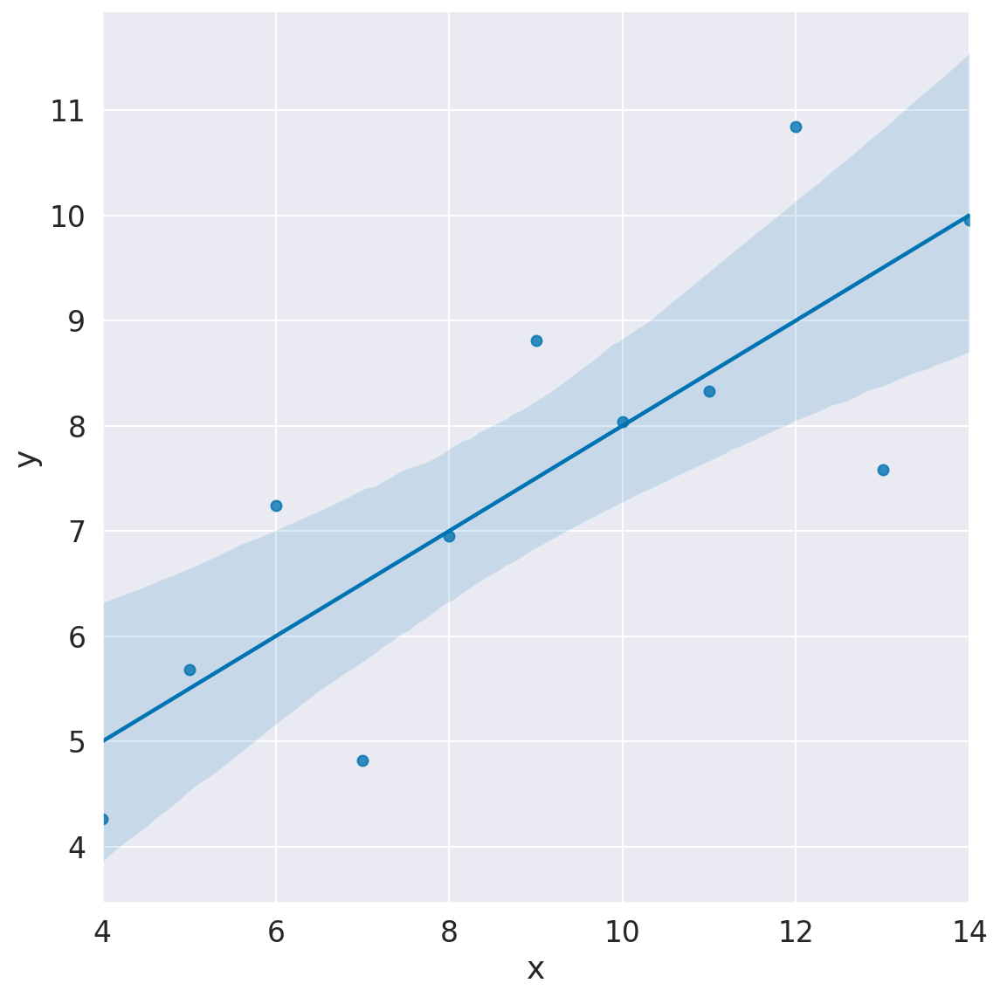

In [6]:
sns.lmplot(x='x', y='y', data=anscombe[anscombe['dataset']=='I'], height=8)

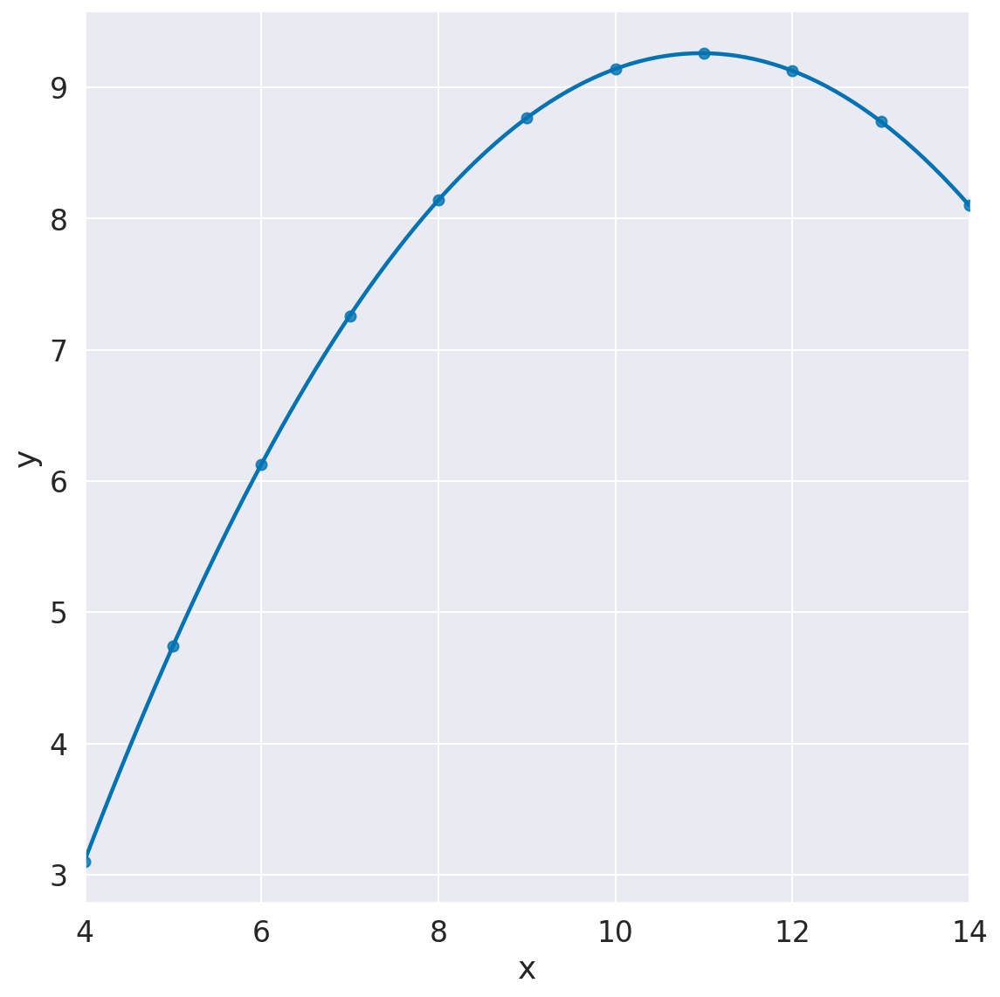

In [7]:
sns.lmplot(x='x', y='y', data=anscombe[anscombe['dataset']=='II'], height=8, order=2)

<AxesSubplot:xlabel='time', ylabel='firing_rate'>

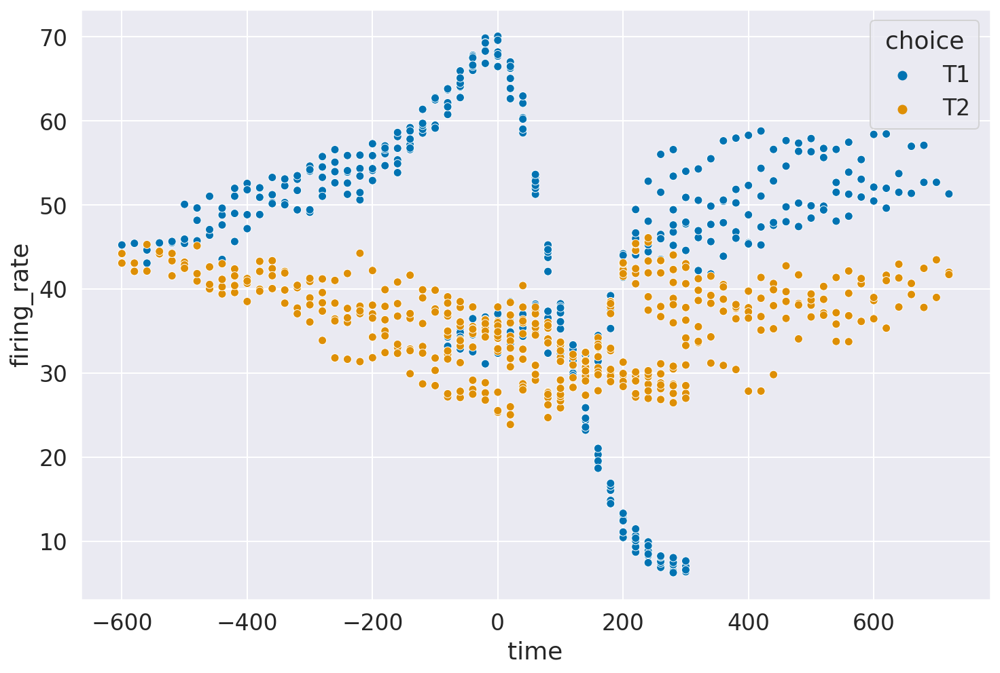

In [8]:
dots = sns.load_dataset('dots')
sns.scatterplot(data=dots,x='time', y='firing_rate', hue='choice')

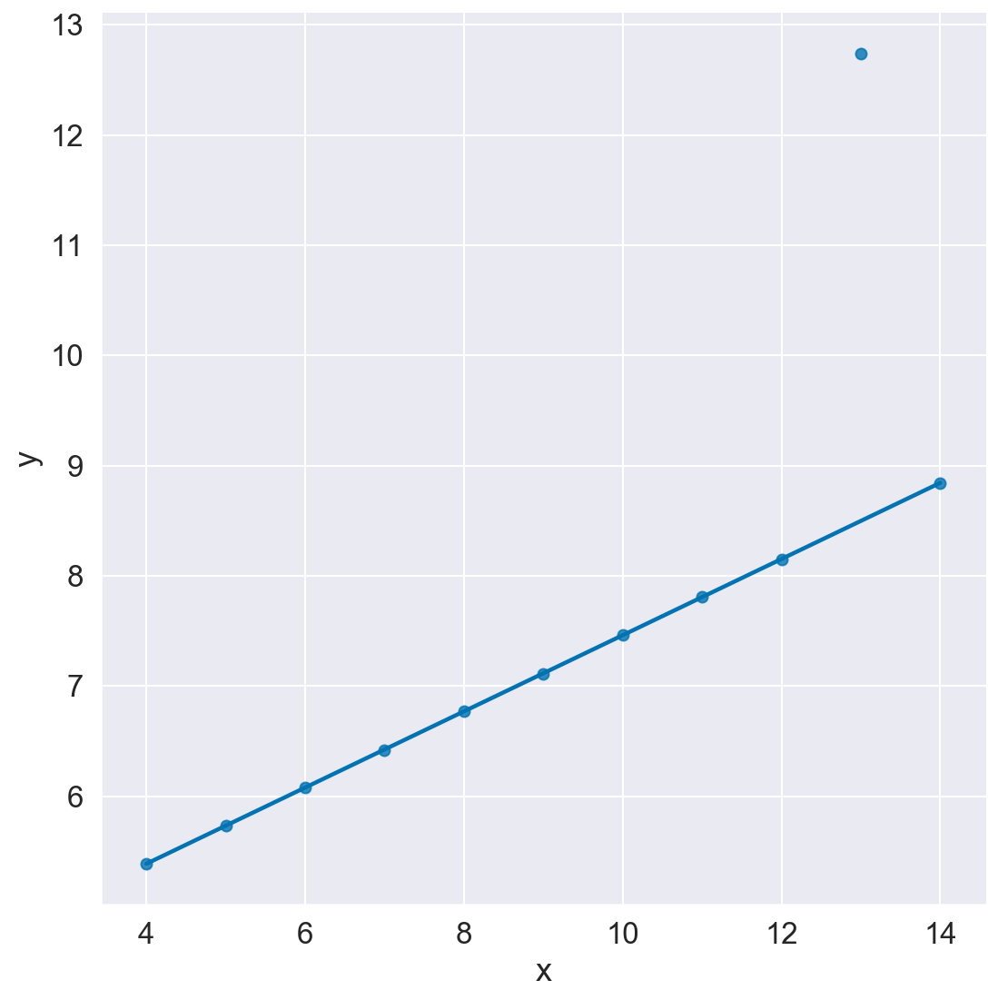

In [ ]:
sns.lmplot(x='x', y='y', data=anscombe[anscombe['dataset']=='III'], height=8, robust=True, ci=None)

In [ ]:
iris = sns.load_dataset('iris')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


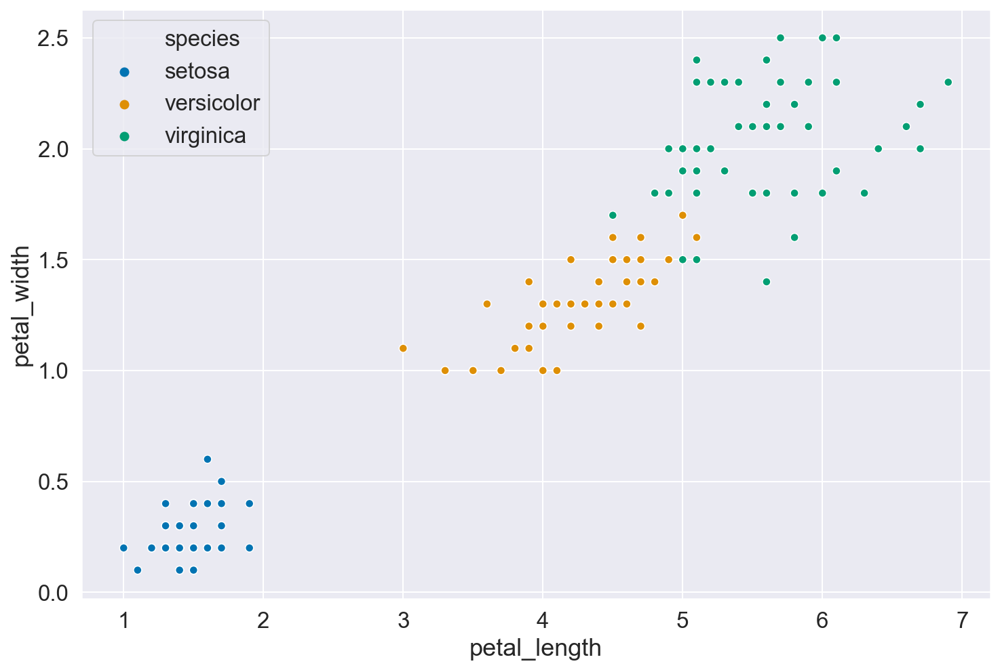

In [ ]:
sns.scatterplot('petal_length', 'petal_width', hue='species', data=iris)

## Exercise:
On the same plot, fit 3 linear models for the 3 different iris species with the same x and y axes

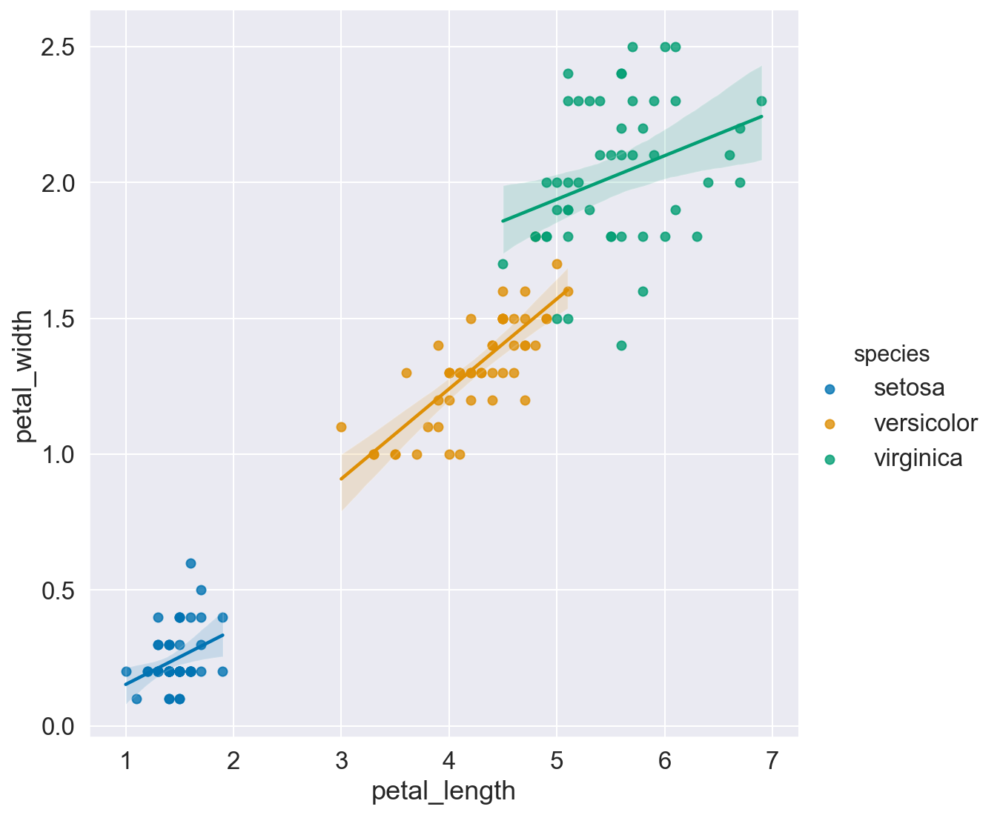

In [ ]:
sns.lmplot('petal_length', 'petal_width', hue='species', data=iris, height=8)

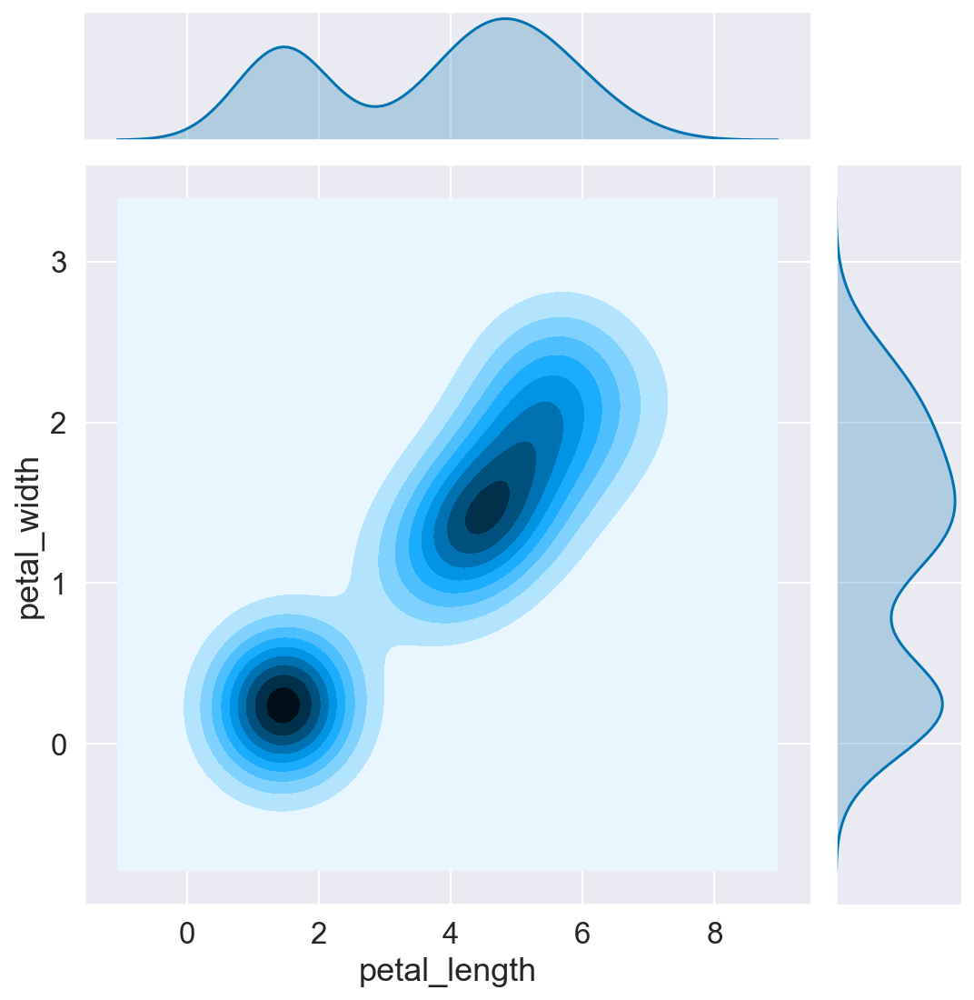

In [ ]:
sns.jointplot('petal_length', 'petal_width', data=iris, height=8, kind='kde')

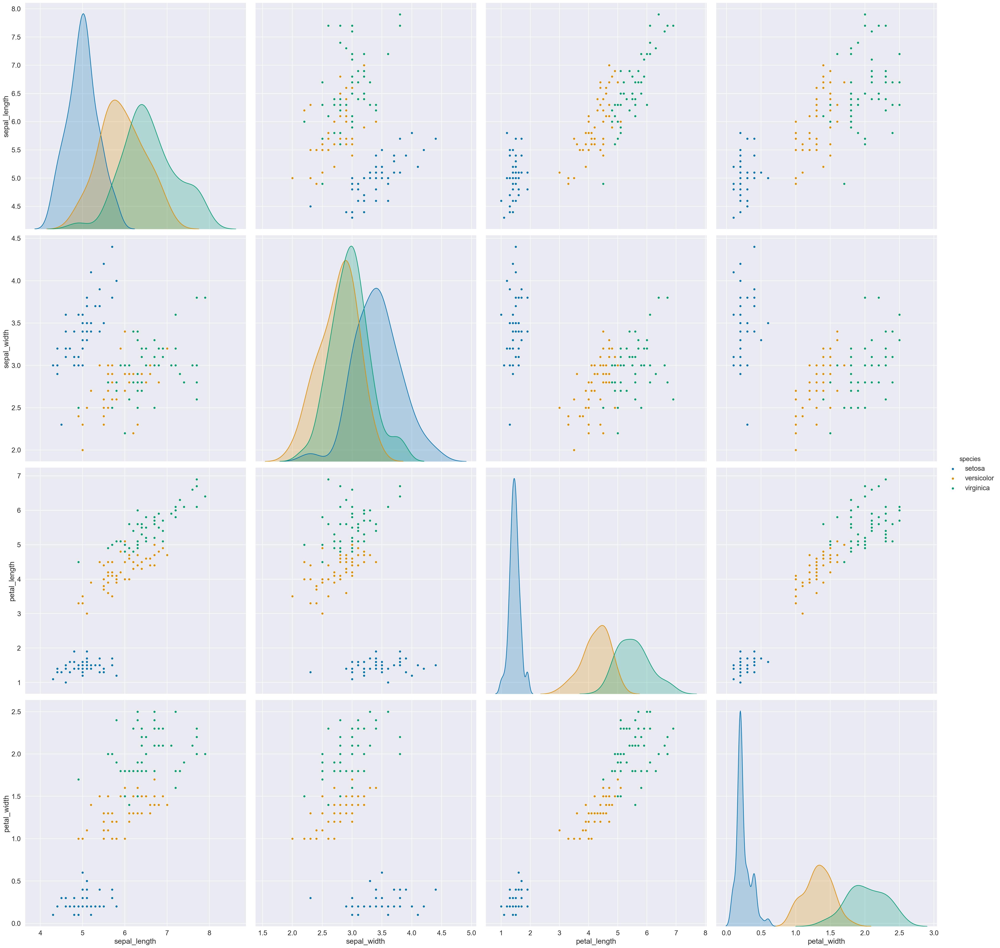

In [ ]:
sns.pairplot(iris, height=8, hue='species')

How about categorical data? 

We can make boxplots and violin plots simply by running:

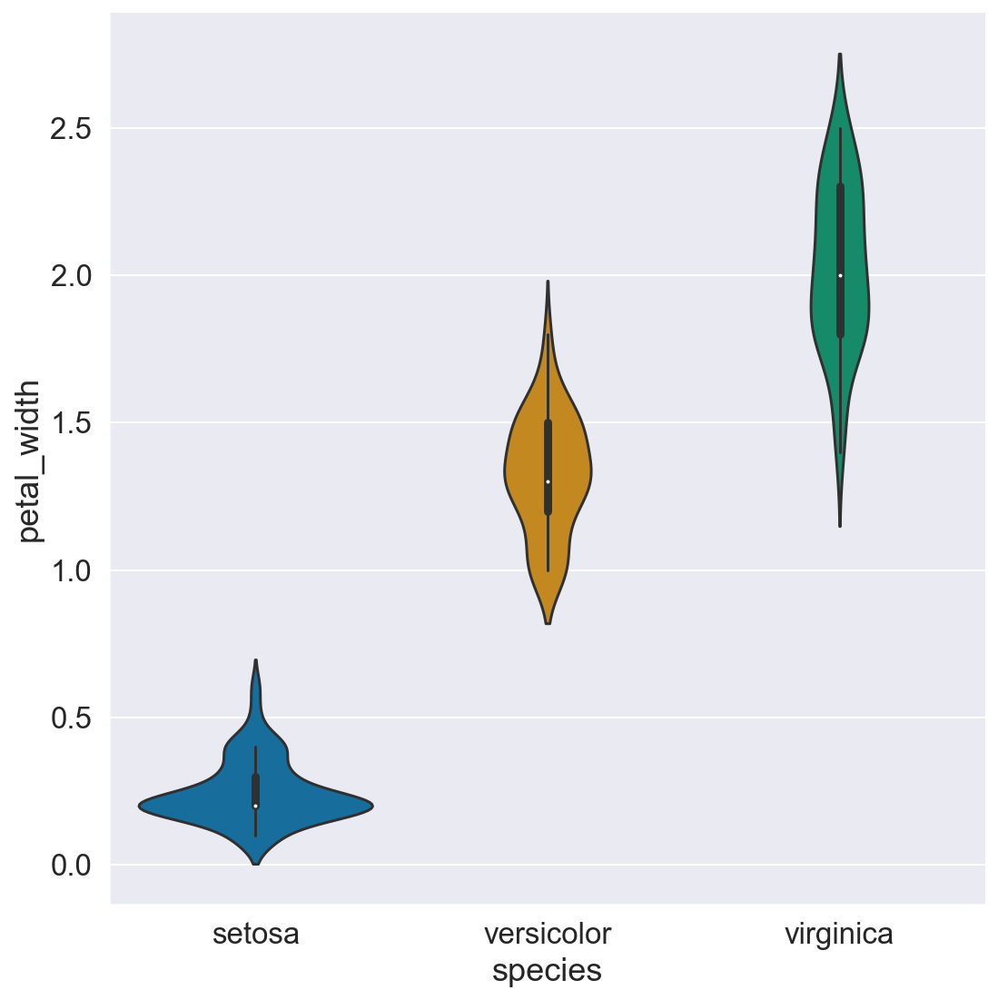

In [ ]:
sns.catplot(y='petal_width', x='species',
            kind='violin', data=iris, height=8)

**Exercise:** Load up the flights dataset, plot a linear model of the passengers number as a function of year, one for each month of the year.

In [ ]:
df = sns.load_dataset('flights')
df.head()

,year,month,passengers
0,1949,January,112
1,1949,February,118
2,1949,March,132
3,1949,April,129
4,1949,May,121


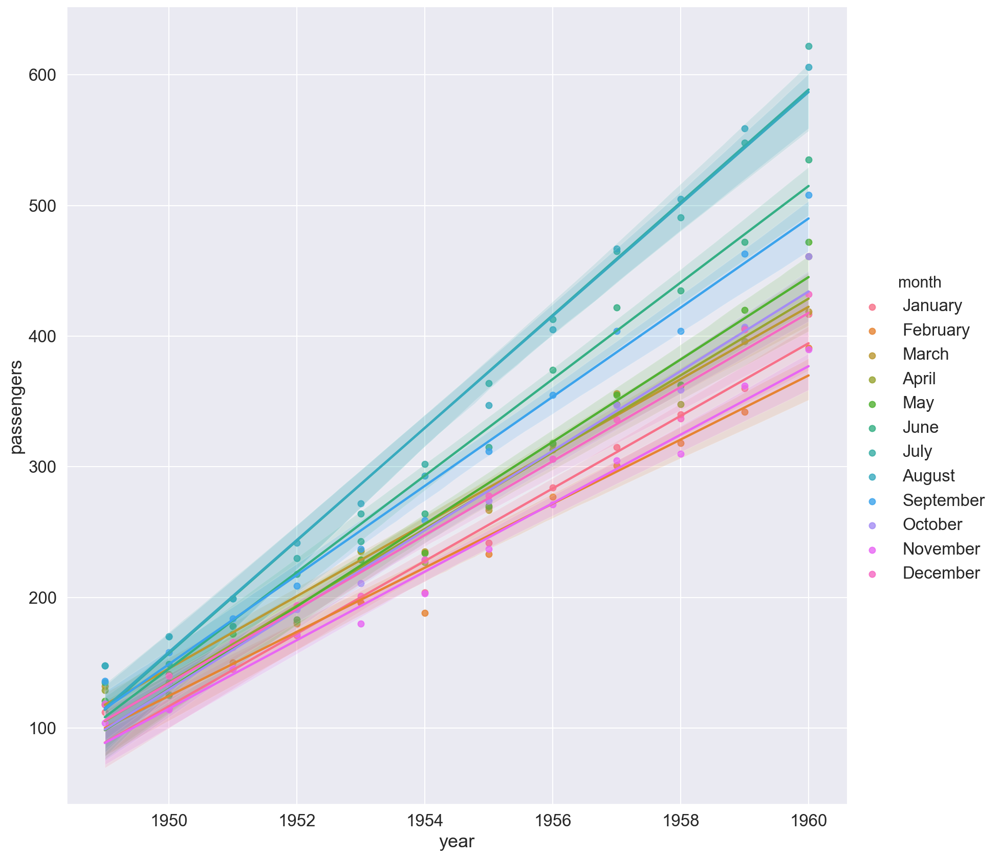

In [ ]:
sns.lmplot('year', 'passengers', data=df, hue='month', height=12)

**Exercise:** Load up the diamonds dataset from seaborn. Plot the price as a function of carat, with different color grades colored differently. choose a small marker size and change the transparency (alpha agrument) to a smaller value than 1. Add some jitter to the x values to make them clearer.

In [ ]:
df = sns.load_dataset('diamonds')
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


(0, 4)

(200.0, 20000.0)

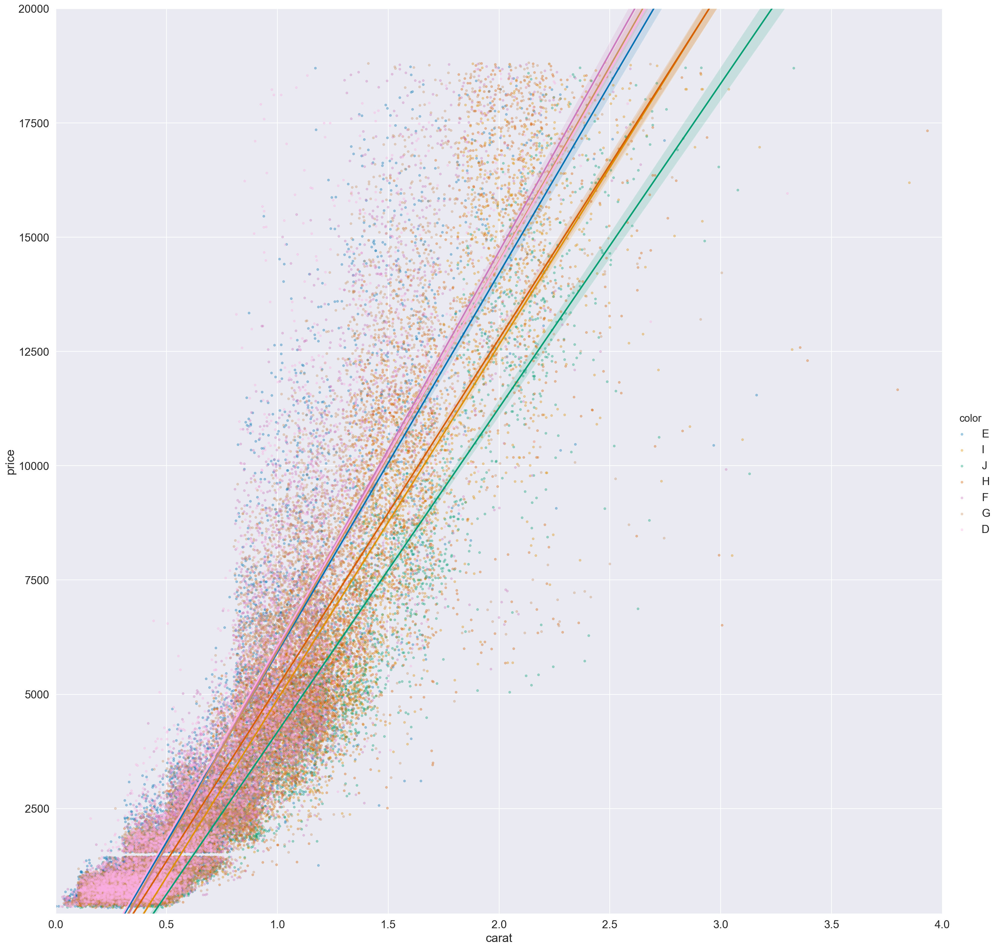

In [ ]:
sns.lmplot(x='carat', y='price', hue='color', 
           data=df, height=20, markers='.', 
           x_jitter=0.2, scatter_kws={'alpha':0.3})
plt.xlim((0, 4))
plt.ylim((2e2, 2e4))

**Exercise:** Load up the Titanic dataset from seaborn. Make a boxplot of the fare of the ticket paid against whether a person survived or not.

In [ ]:
df = sns.load_dataset('titanic')
df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


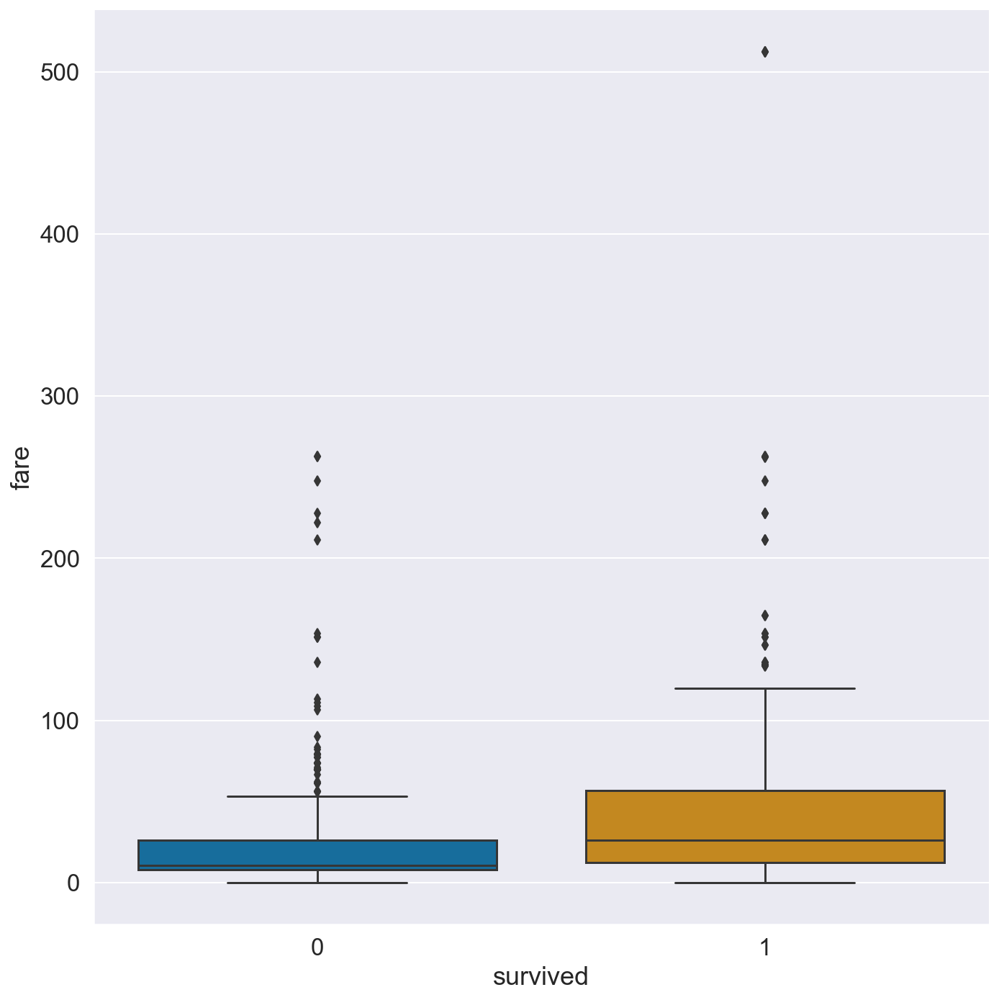

In [ ]:
sns.catplot('survived', 'fare', kind='box', data=df, height=10)

## Polar coordinates

In [ ]:
plt.quiver??

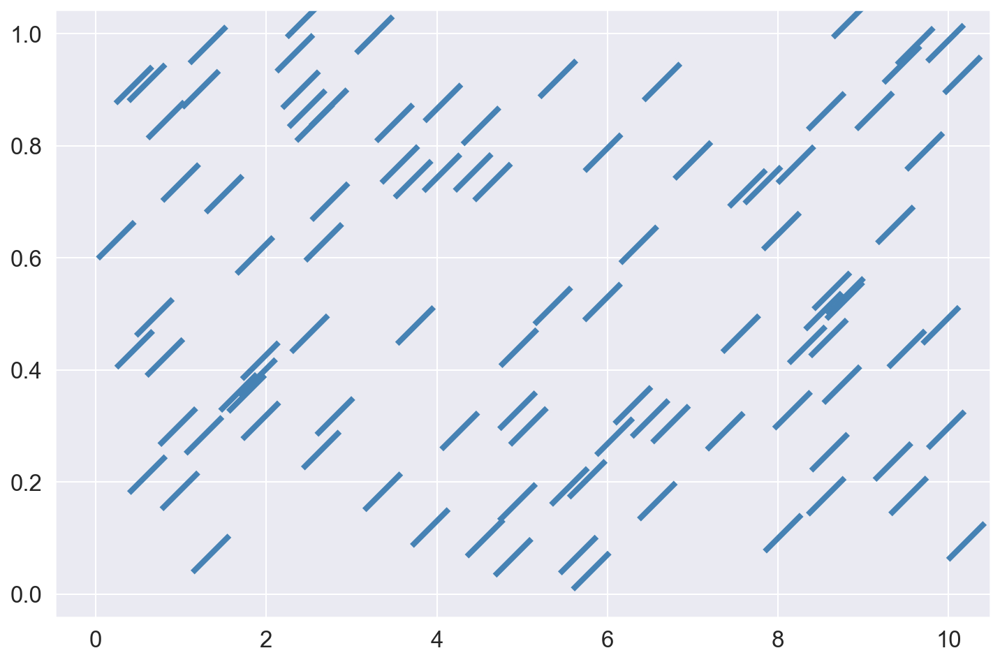

In [ ]:
X = np.random.uniform(0, 10, 100)
Y = np.random.uniform(0, 1, 100)

U = np.ones_like(X)
V = np.ones_like(Y)

f = plt.figure()
ax = f.add_subplot(111)
ax.quiver(X, Y, U, V, headlength=0, headaxislength=0, color='steelblue')





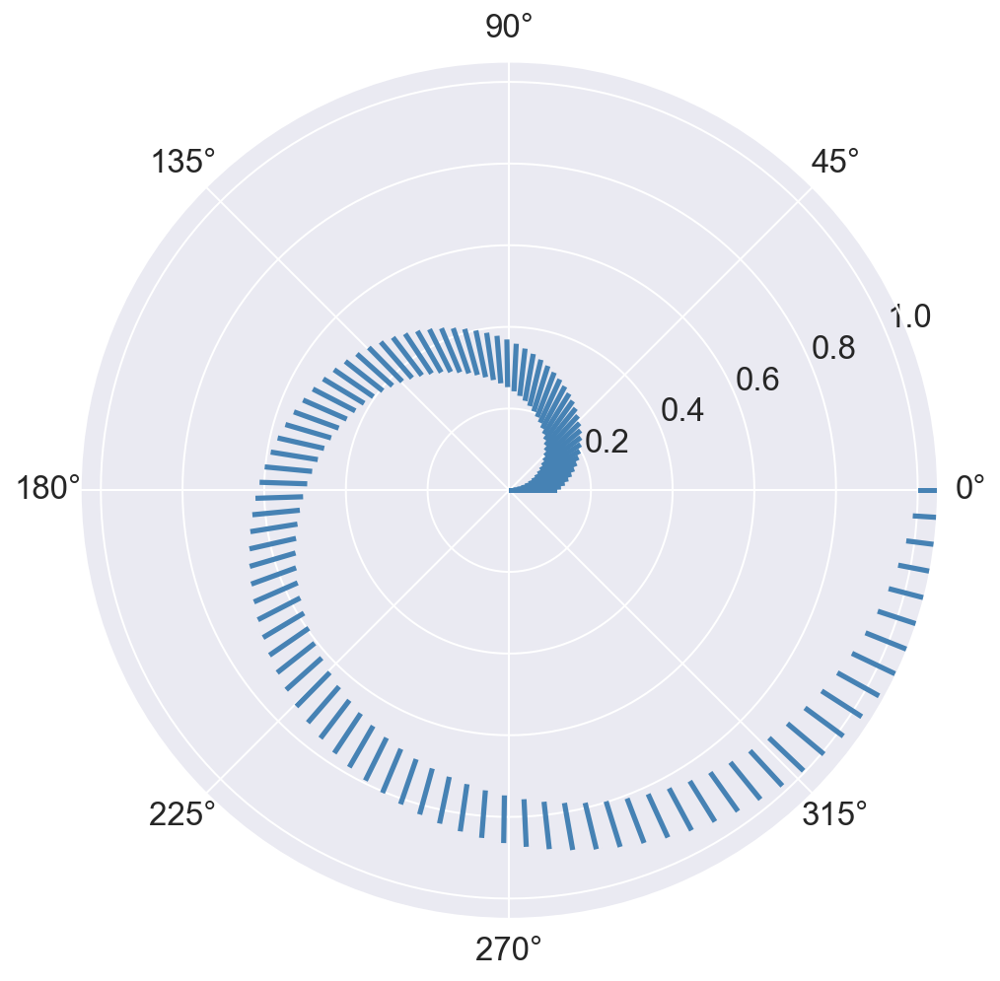

In [ ]:
theta = np.linspace(0,2*np.pi,100)
r = np.linspace(0, 1, 100)

dr = 1
dt = 0


U = dr * cos(theta) - dt * sin (theta)
V = dr * sin(theta) + dt * cos(theta)


f = plt.figure()
ax = f.add_subplot(111, polar=True)
ax.quiver(theta, r, U, V, headlength=0, headaxislength=0,  color='steelblue')

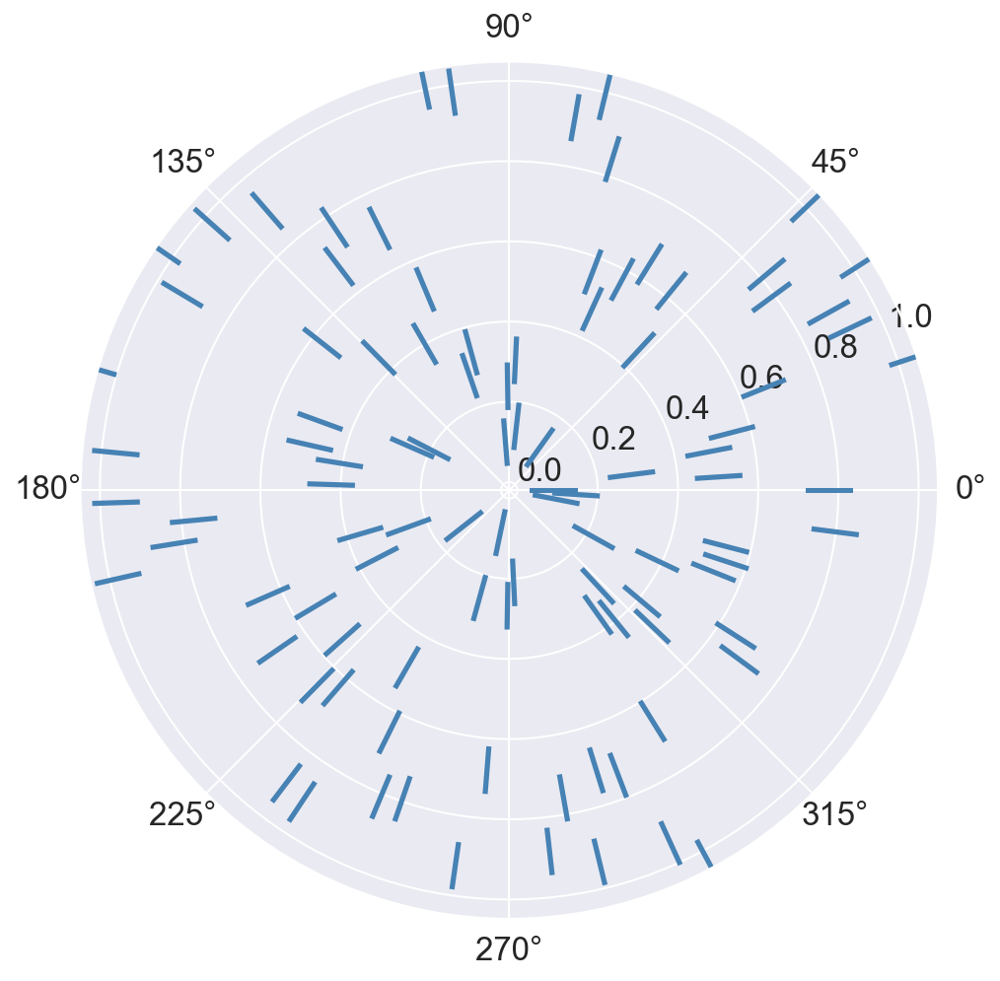

In [ ]:
theta = np.linspace(0,2*np.pi,100)
r = np.random.uniform(0, 1, 100)

dr = 1
dt = 0


U = dr * cos(theta) - dt * sin (theta)
V = dr * sin(theta) + dt * cos(theta)


f = plt.figure()
ax = f.add_subplot(111, polar=True)
ax.quiver(theta, r, U, V, headlength=0, headaxislength=0,  color='steelblue')

**Exercise 1:** radial plot with all sticks starting at a radius of 1

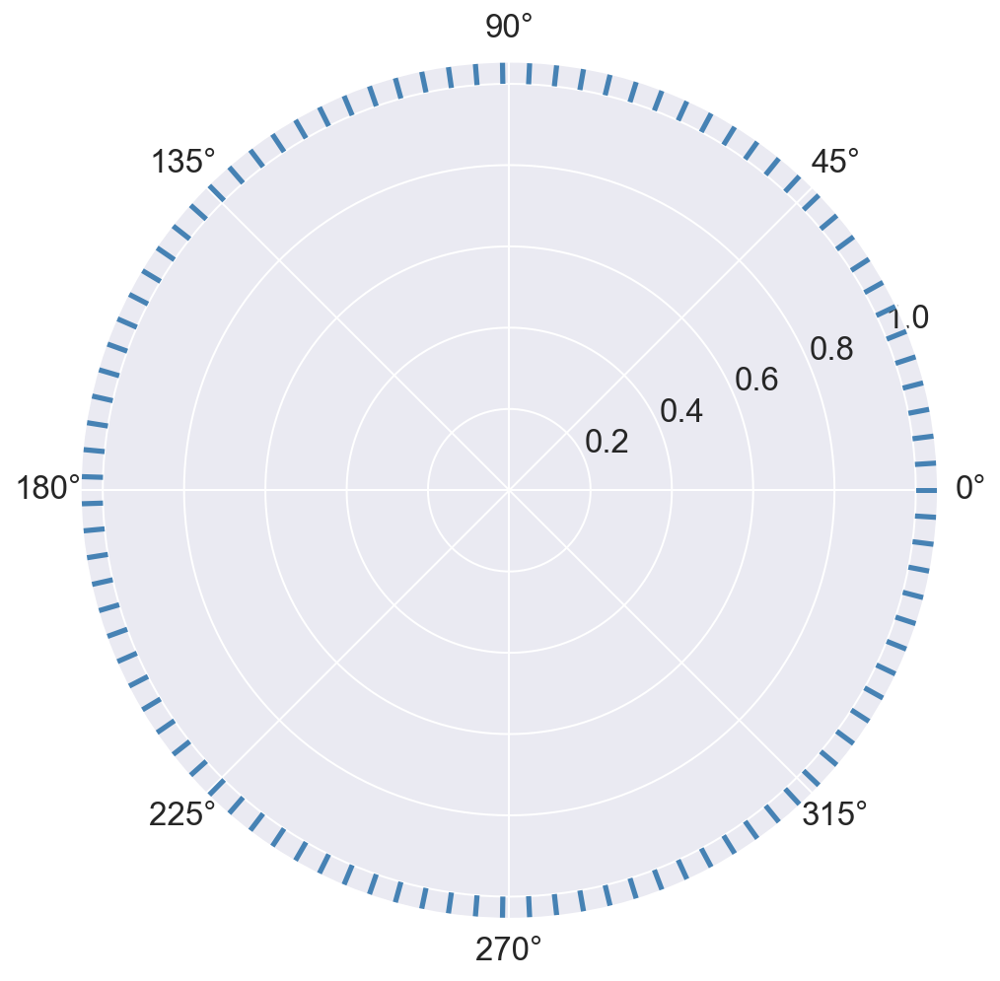

In [ ]:
theta = np.linspace(0,2*np.pi,100)
r = 1

U = cos(theta)
V = sin(theta)

f = plt.figure()
ax = f.add_subplot(111, polar=True)
ax.quiver(theta, r, U, V, headlength=0, headaxislength=0,  color='steelblue')

**Exercise 2:** all sticks are horizontal

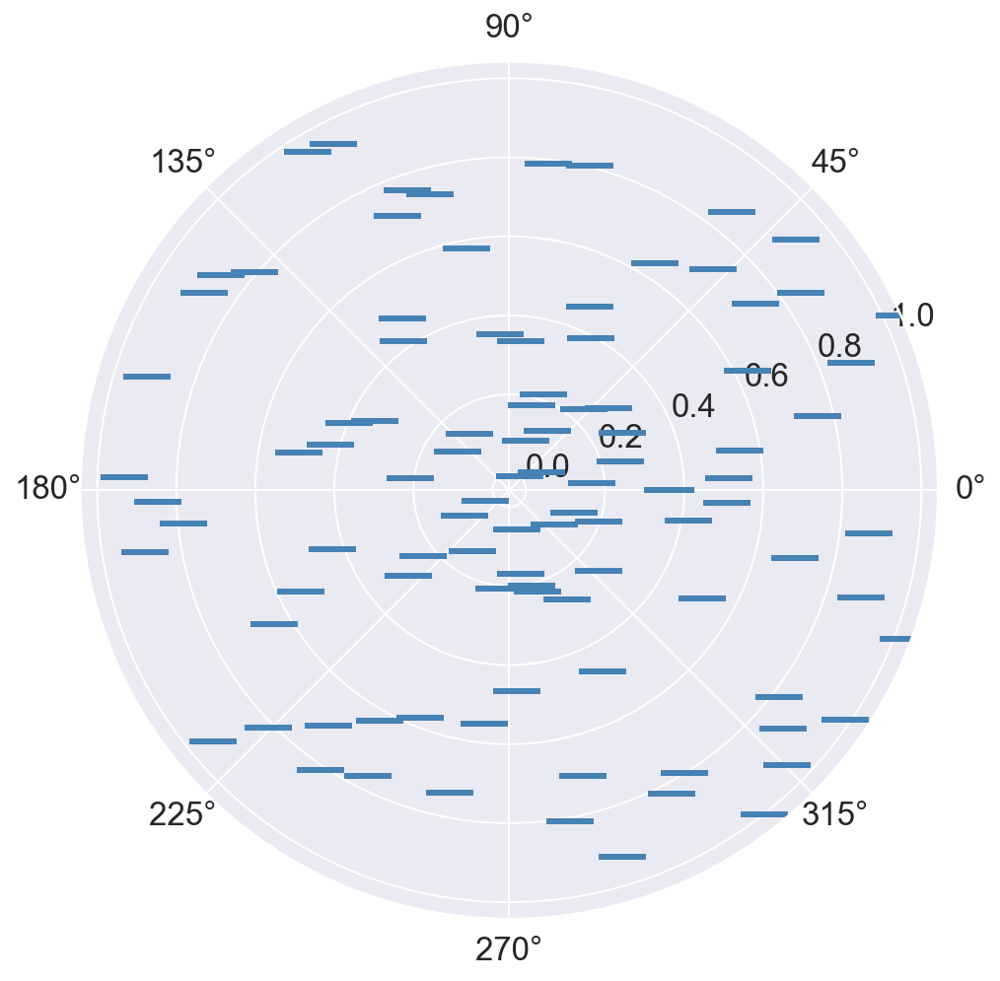

In [ ]:
theta = np.linspace(0,2*np.pi,100)
r = np.random.uniform(0, 1, 100)

U = 1
V = 0

f = plt.figure()
ax = f.add_subplot(111, polar=True)
ax.quiver(theta, r, U, V, headlength=0, headaxislength=0,  color='steelblue')

**Exercise 3:** Use a 'mollweide' projection using the projection argument of add_subplot(). Use horizontal sticks now but make sure your sticks span the entire space. 

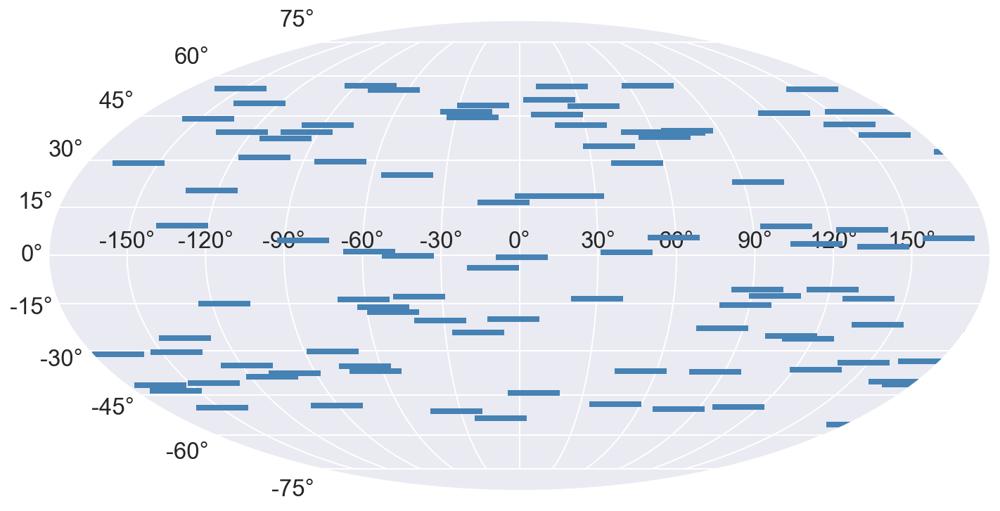

In [ ]:
theta = np.linspace(-np.pi, np.pi, 100)
r = np.random.uniform(-1, 1, 100)

U = 1
V = 0

f = plt.figure()
ax = f.add_subplot(111, projection='mollweide')
ax.quiver(theta, r, U, V, headlength=0, headaxislength=0,  color='steelblue')

# 2. Density Estimation

Often when we are making plots, we are trying to estimate the underlying distribution from which it was randomly drawn, this is known as Density Estimation in statistics. The simplest density estimator that does not make particular assumptions on the distribution of the data (we call this nonparametric) is the histogram.

## Histograms

In [ ]:
# import out first dataset, an example from biology
iris = sns.load_dataset('iris')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


(array([ 9., 23., 14., 27., 16., 26., 18.,  6.,  5.,  6.]),
 array([4.3 , 4.66, 5.02, 5.38, 5.74, 6.1 , 6.46, 6.82, 7.18, 7.54, 7.9 ]),
 <a list of 10 Patch objects>)

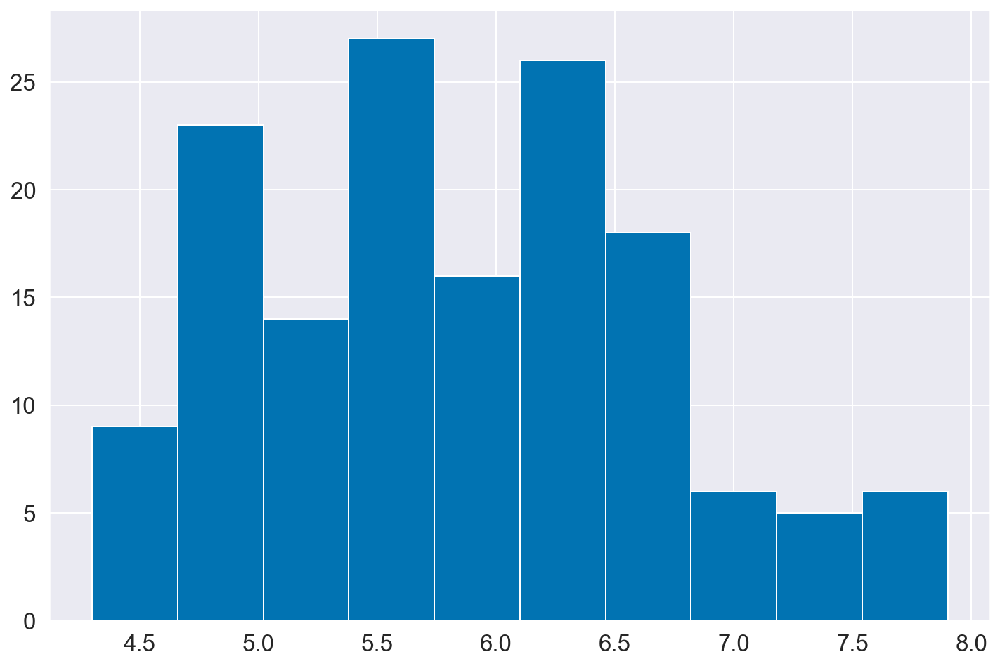

In [ ]:
data = iris['sepal_length']
plt.hist(data)

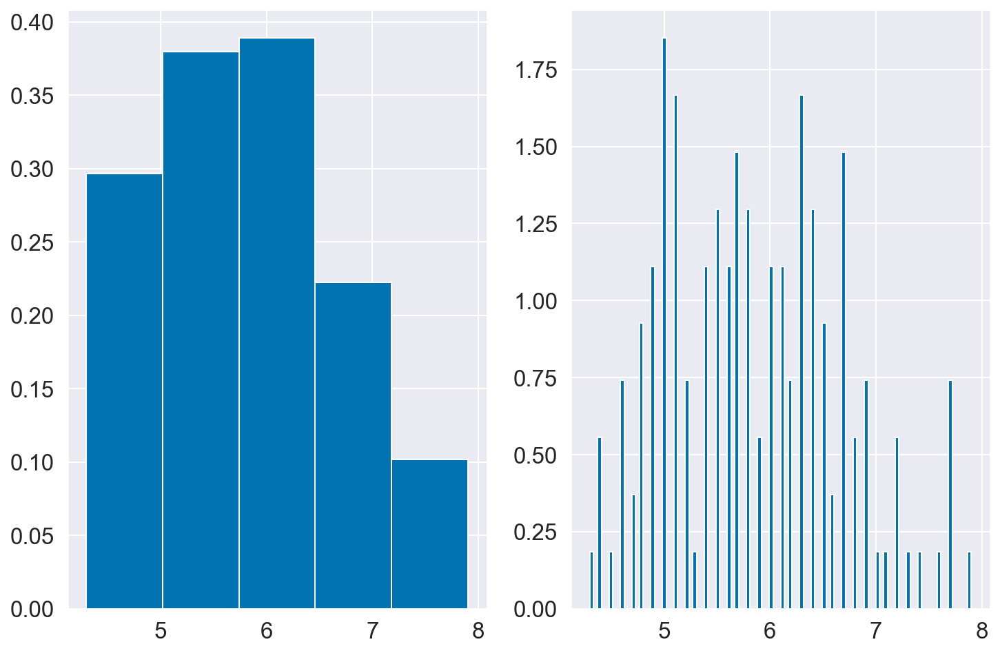

In [ ]:
data = iris['sepal_length']
f, (ax1, ax2) = plt.subplots(1, 2)
ax1.hist(data, bins=5, density=True);
ax2.hist(data, bins=100, density=True);

Formally, The histogram estimator is $$ \hat{p}(x) = \frac{\hat{\theta_j}}{h} $$ where $$ \hat{\theta_j} = \frac{1}{n} \sum_{i=1}^n I(X_i \in B_j ) $$

We can calculate the mean squared error, which is a metric that tells us how well our estimator is, it turns out to be: $$MSE(x) = bias^2(x) + Var(x) = Ch^2 + \frac{C}{nh} $$
minimized by choosing $h = (\frac{C}{n})^{1/3}$, resulting in a risk (the expected value of the MSE) of:
$$ R = \mathcal{O}(\frac{1}{n})^{2/3}$$
This means that 
 - There is a bias-variance tradeoff when it comes to choosing the width of the bins, lower width ($h$), means more bias and less variance. There is no choice of $h$ that optimizes both.
 - The risk goes down at a pretty slow rate as the number of datapoints increases, which begs the question, is there a better estimator that converges more quickly? The answer is yes, this is achieved by:

## Kernel Density Estimation

Kernels follow the conditions:
$$ K(x) \geq 0, \int K(x) dx = 1, \int x K(x) dx = 0$$

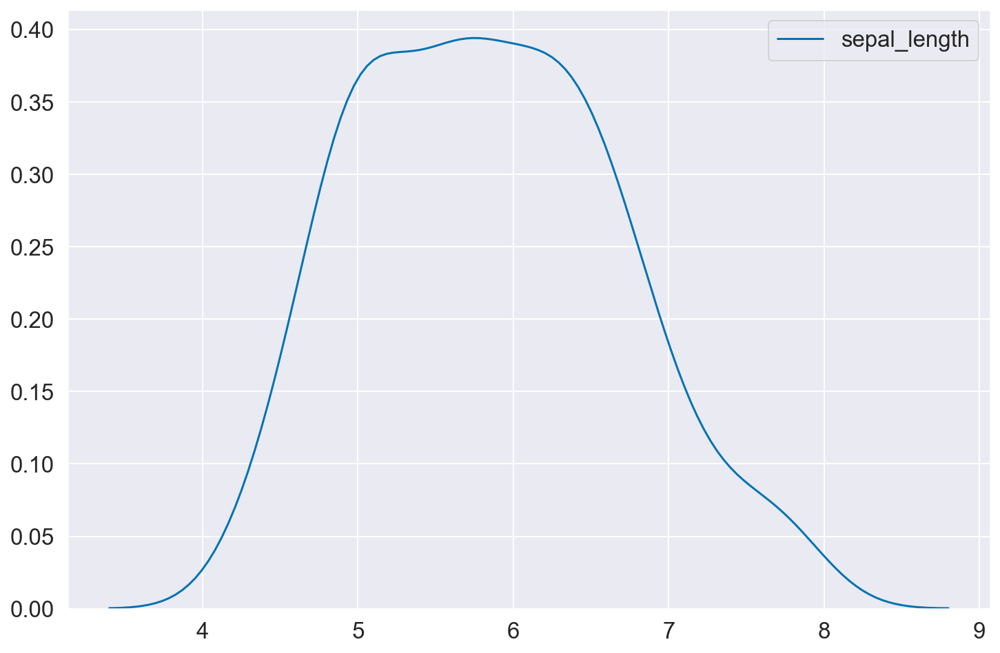

In [ ]:
sns.kdeplot(data, bw=0.3);

So how is this better than the histogram?
We can again calculate the MSE, which turns out to be:

$$MSE(x) = bias^2(x) + Var(x) = C_1h^4 + \frac{C_2}{nh}$$

minimized by choosing $ h = (\frac{C_1}{4nC_2})^{1/5} $, giving a risk of:

$$ R_{KDE} = \mathcal{O}(\frac{1}{n})^{4/5} < R_{histogram}$$

This still has a bias-variance tradeoff, but the estimator converges faster than in the case of histograms. Can we do even better? The answer is no, due to something in statistics called the minimax theorem.

**Exercise**: Instead of using just petal length, consider a 2D distribution with the two axes being petal length and petal width. Plot the distribution, the Histogram of the distribution and the KDE of the distribution. Make sure you play around with bin numbers and bandwidth to get a reasonably satisfying plot

In [ ]:
data=iris[['petal_length', 'petal_width']]

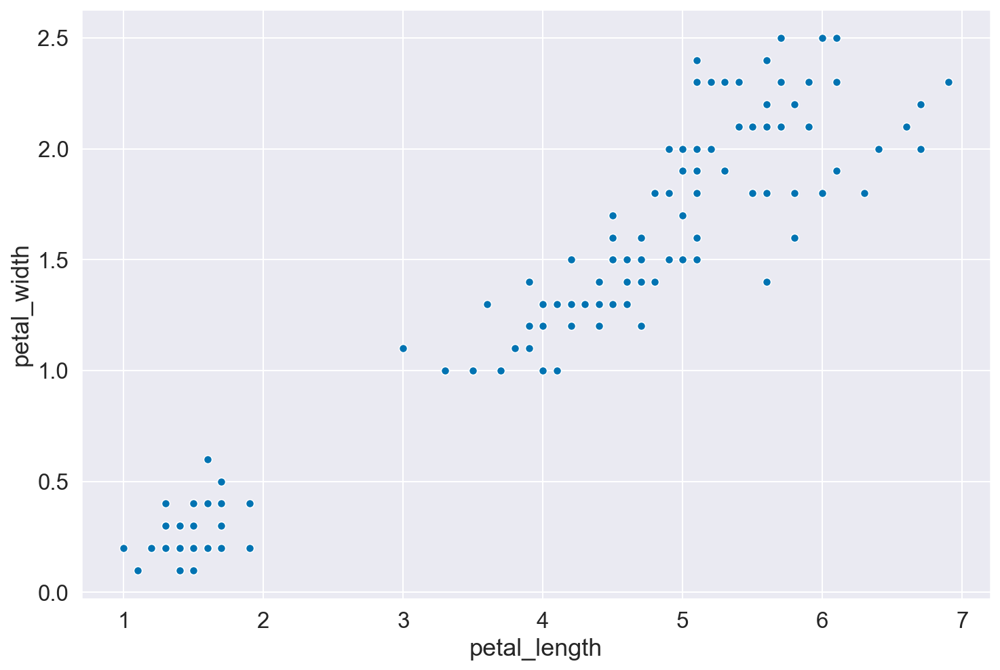

In [ ]:
sns.scatterplot('petal_length', 'petal_width', data=iris)

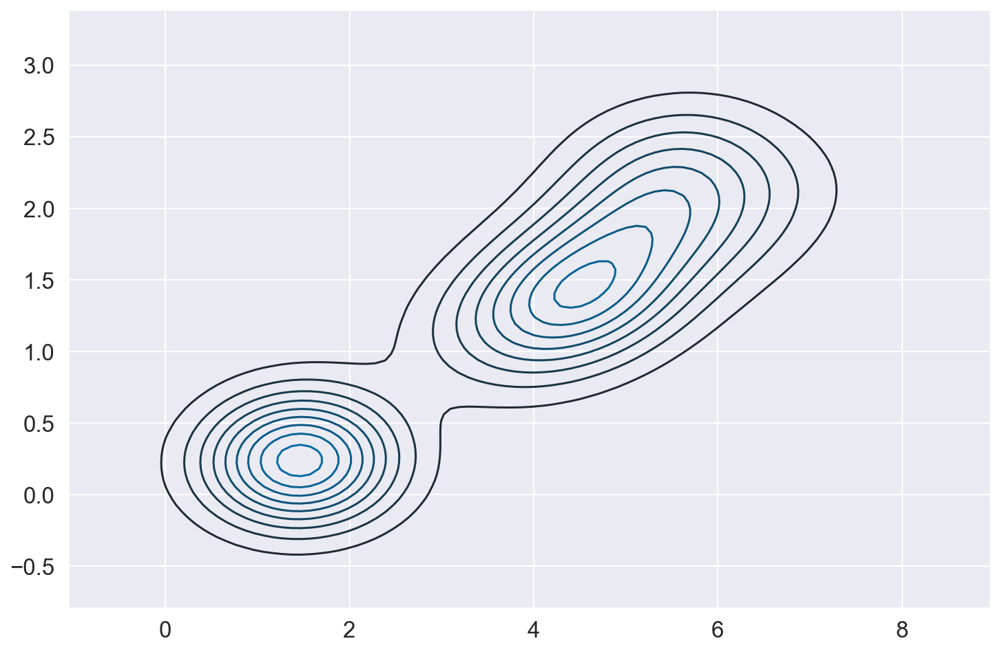

In [ ]:
sns.kdeplot(data=data);

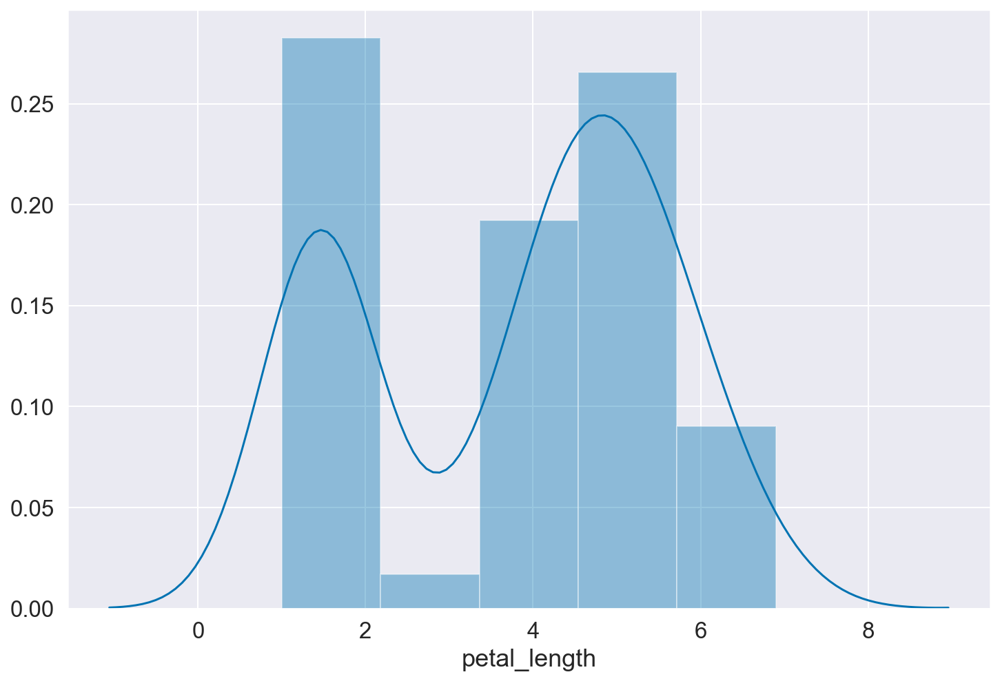

In [ ]:
sns.distplot(iris['petal_length'])

# 3. Visualizing High Dimensional Datasets

In [ ]:
from sklearn.datasets import load_digits
digits = load_digits()

In [ ]:
shape(digits['data'])

(1797, 64)

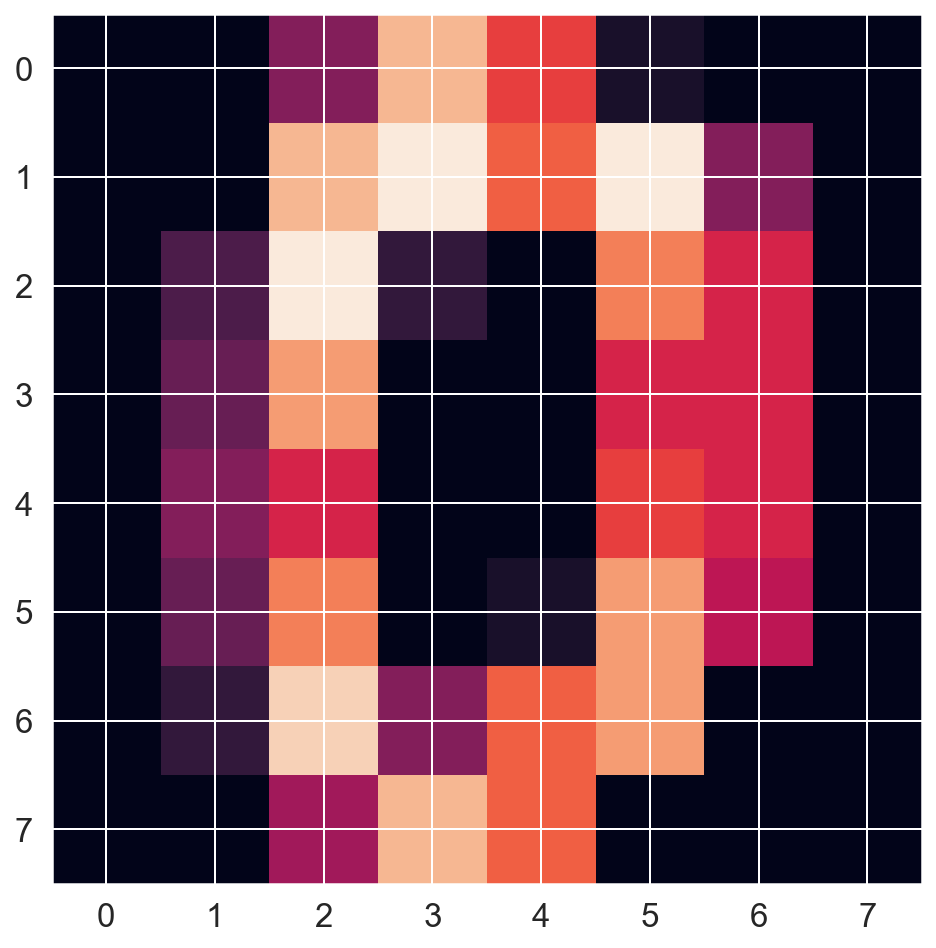

In [ ]:
plt.imshow(digits['images'][0])

## Principal Component Analysis

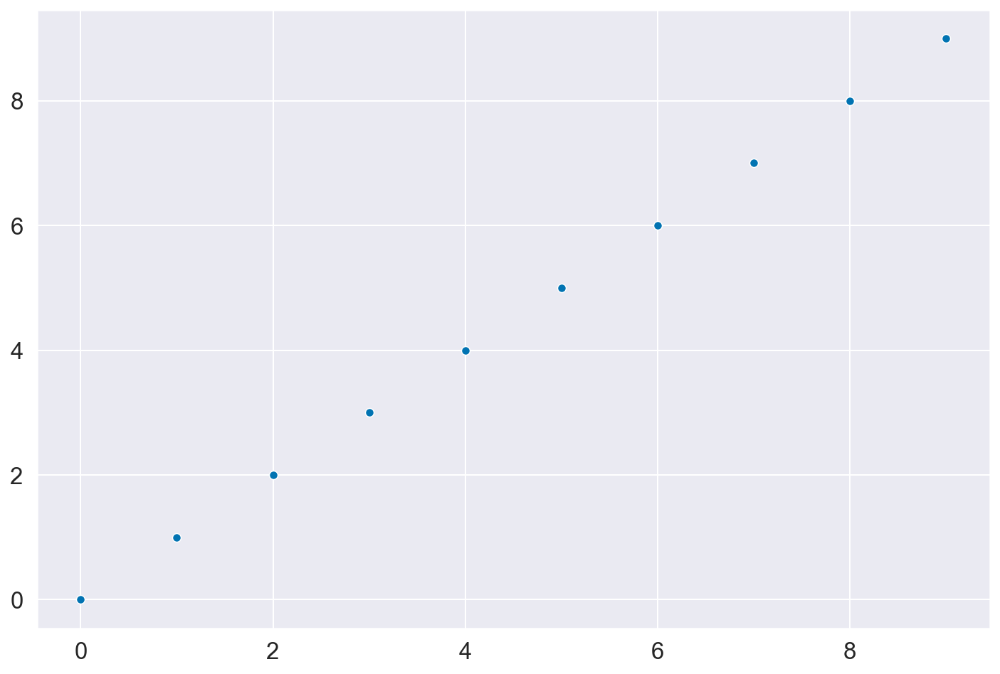

In [ ]:
x = np.linspace(0, 9, 10)
y = np.linspace(0, 9, 10)
sns.scatterplot(x, y)

PCA computes the linear projections of greatest variance from the top eigenvectors of the data covariance matrix


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(1)
principal_components = pca.fit_transform(np.array([x, y]).reshape(-1, 1))

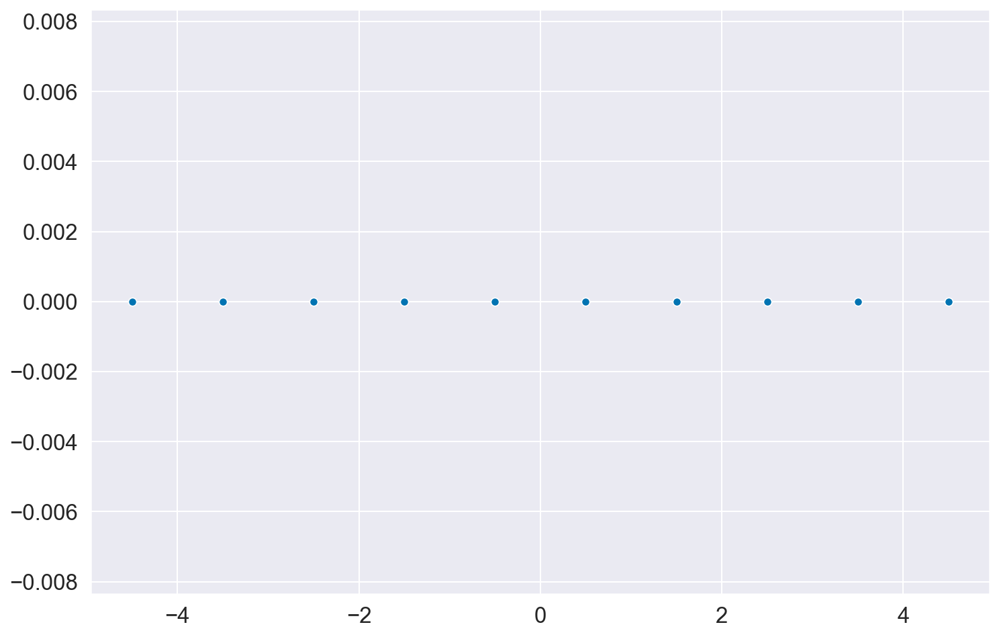

In [ ]:
sns.scatterplot(principal_components[:, 0], [0]*20)

Check out some more cool visualization of PCA at https://setosa.io/ev/principal-component-analysis/ and read more about the math and applications at https://www.cs.cmu.edu/~bapoczos/other_presentations/PCA_24_10_2009.pdf 

In [ ]:
pca = PCA(2)
projected = pca.fit_transform(digits['data'])

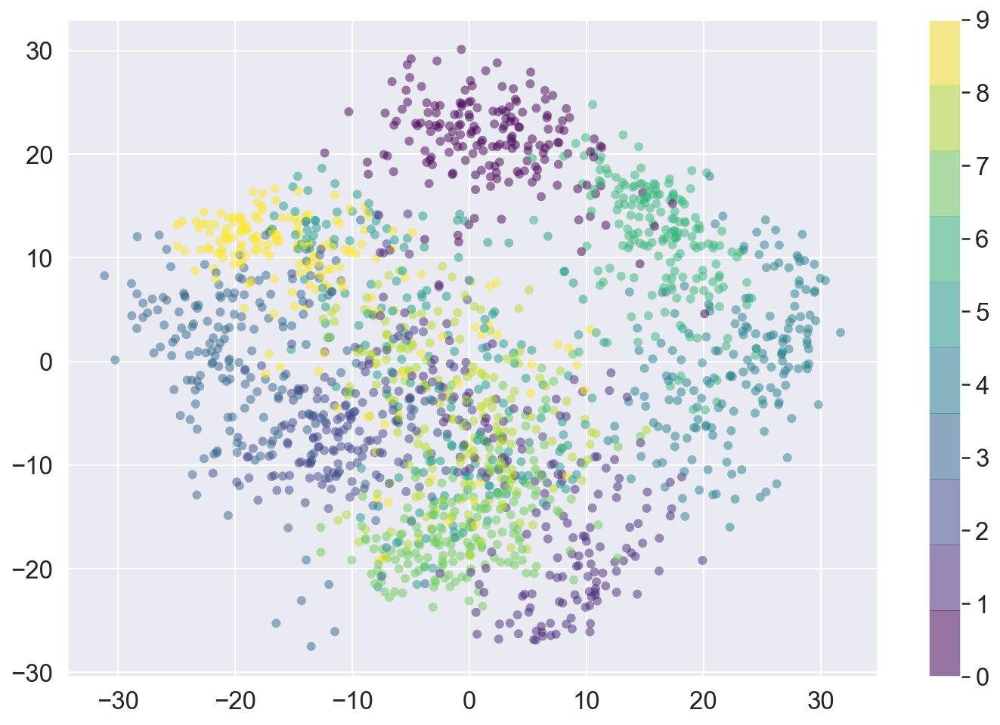

In [ ]:
plt.scatter(projected[:, 0], projected[:, 1],
            c=digits.target, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('viridis', 10))
plt.colorbar()

In [ ]:
from sklearn.datasets import make_swiss_roll
X, t = make_swiss_roll(1000, 0.05)

In [ ]:
import mpl_toolkits.mplot3d as p3
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
ward = AgglomerativeClustering(n_clusters=5, 
                               connectivity=kneighbors_graph(X, n_neighbors=5, include_self=False),
                               linkage='ward').fit(X)
labels = ward.labels_

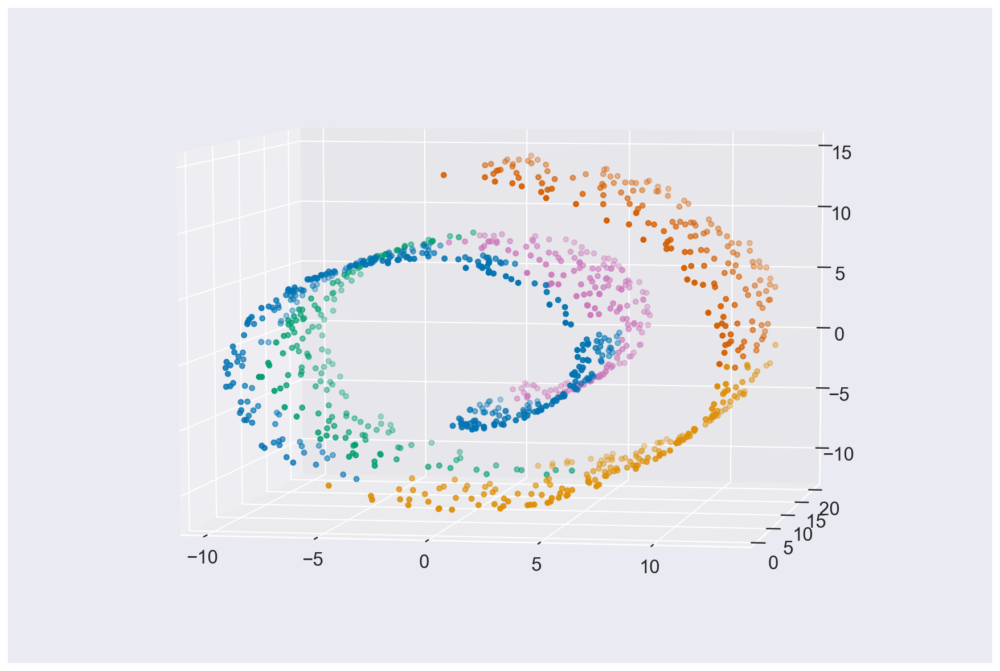

In [ ]:
fig = plt.figure()
ax = p3.Axes3D(fig)
ax.view_init(7, -80)
for label in np.unique(labels):
    ax.scatter(X[labels == label, 0], X[labels == label, 1], X[labels == label, 2])

In [ ]:
pca = PCA(2)
projected = pca.fit_transform(X)

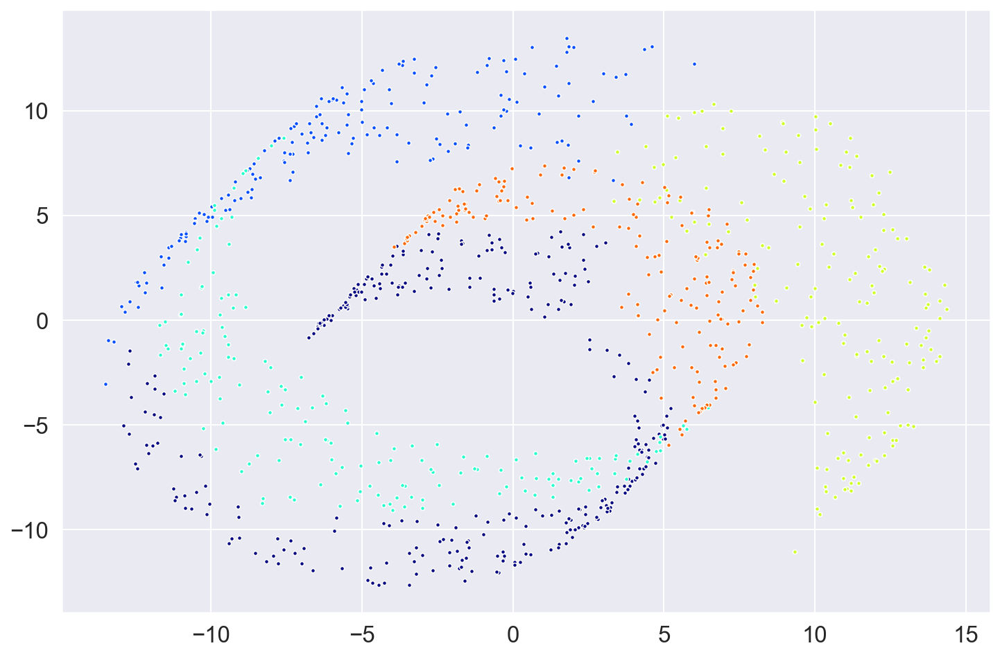

In [ ]:
for label in np.unique(labels):
    sns.scatterplot(projected[labels == label, 0], projected[labels == label, 1],
               color=plt.cm.jet(float(label) / np.max(labels + 1)), marker='.')

## t-Distributed Stochastic Neighbor Embedding

Converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data.
First, t-SNE constructs a probability distribution over pairs of high-dimensional objects in such a way that similar objects have a high probability of being picked while dissimilar points have an extremely small probability of being picked. Second, t-SNE defines a similar probability distribution over the points in the low-dimensional map, and it minimizes the Kullback–Leibler divergence (KL divergence ) between the two distributions with respect to the locations of the points in the map.

For more details on t-SNE, check out the original paper http://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf

In [ ]:
from sklearn.manifold import TSNE
tSNE = TSNE(learning_rate=10,
            perplexity=30)
projected = tSNE.fit_transform(X)

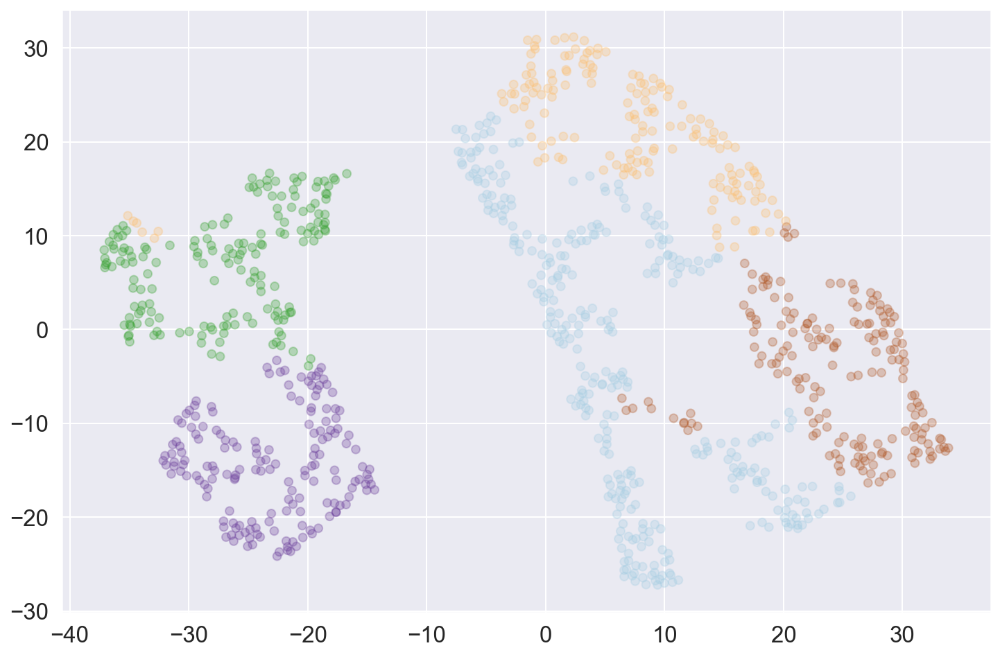

In [ ]:
plt.scatter(projected[:, 0], projected[:, 1],
            c=labels, alpha=0.3,
            cmap=plt.cm.get_cmap('Paired', 5))
#plt.colorbar()

In [ ]:
tSNE = TSNE(learning_rate=10,
            perplexity=30)
projected = tSNE.fit_transform(digits['data'])

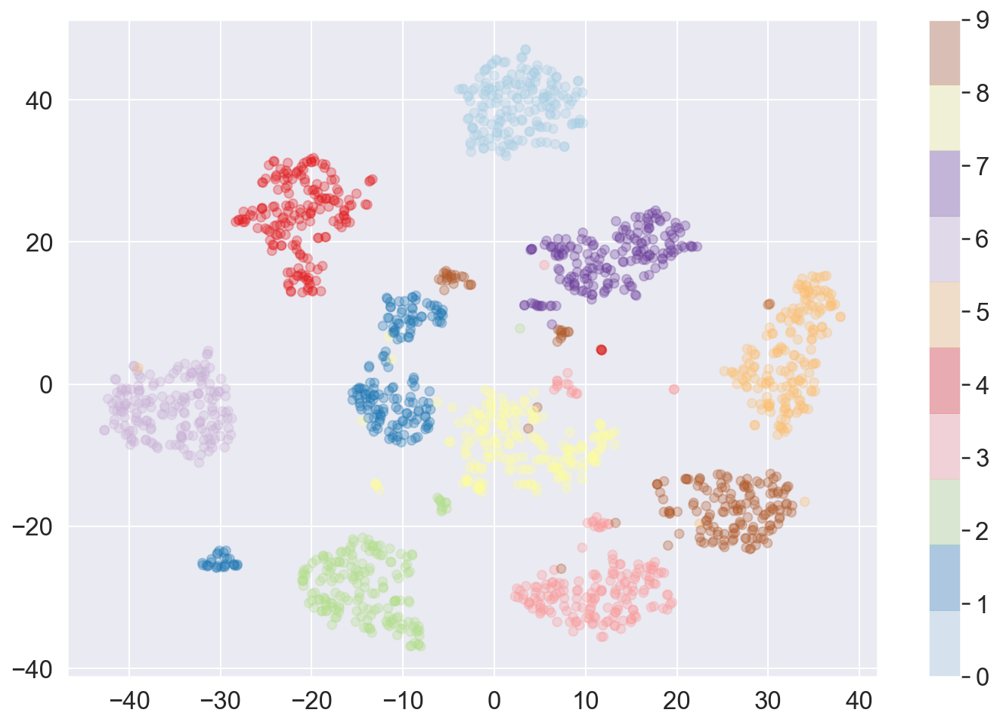

In [ ]:
plt.scatter(projected[:, 0], projected[:, 1],
            c=digits.target, alpha=0.3,
            cmap=plt.cm.get_cmap('Paired', 10))
plt.colorbar()

# 4. Interactive Visualization


In [ ]:
import pandas_datareader.data as web
import datetime
import plotly.figure_factory as ff
import plotly.graph_objs as go

In [ ]:
start = datetime.datetime(2008, 1, 1)
end = datetime.datetime(2018, 1, 1)

In [ ]:
# This fetches the stock prices for the S%P 500 for the dates we selected from Yahoo Finance.
spy_df = web.DataReader('SPY', 'yahoo', start, end).reset_index()

In [ ]:
spy_df.head()

,Date,High,Low,Open,Close,Volume,Adj Close
0,2008-01-02,146.990005,143.880005,146.529999,144.929993,204935600.0,112.588051
1,2008-01-03,145.490005,144.070007,144.910004,144.860001,125133300.0,112.533707
2,2008-01-04,143.440002,140.910004,143.339996,141.309998,232330900.0,109.775894
3,2008-01-07,142.229996,140.100006,141.809998,141.190002,234991000.0,109.682663
4,2008-01-08,142.899994,138.440002,142.080002,138.910004,326365700.0,107.911469


In [ ]:
data = go.Scatter(x=spy_df.Date, y=spy_df.Close)

go.Figure(data)

**Exercise:** A candlestick chart is a powerful chart in finance that shows the starting price, closing price, highest price and lowerst price of a trading day. Create a aandlestick chart of the first 90 days of the data. You can find Candlestick in the 'go' module.

In [ ]:
data = [go.Candlestick(x=spy_df.Date[0:90],
                       open=spy_df.Open[0:90],
                       high=spy_df.High[0:90],
                       low=spy_df.Low[0:90],
                       close=spy_df.Close[0:90])]
go.Figure(data)

In [ ]:
aapl_df = web.DataReader('AAPL', 'yahoo', start, end).reset_index()
data = [go.Scatter(x=spy_df.Date, y=spy_df.Close, name='SPY'),
        go.Scatter(x=aapl_df.Date, y=aapl_df.Close, name='AAPL')]


layout = dict(title='Yahoo Finance Data')

go.Figure({'data':data, 'layout':layout})

In [ ]:
aapl_df = web.DataReader('AAPL', 'yahoo', start, end).reset_index()
data = [go.Scatter(x=spy_df.Date, y=spy_df.Close, name='SPY'),
        go.Scatter(x=aapl_df.Date, y=aapl_df.Close, name='AAPL') ]


# updatemenus defines buttons and what they do
updatemenus = list([
    dict(active = -1, # initialize with no buttons active
         buttons = list([ # buttons is a list of dictionaries 
            dict(label = 'SPY',
                 method = 'update',
                 args = [{'visible': [True, False]},
                         {'title': 'S&P 500'}]),
            dict(label = 'AAPL',
                 method = 'update',
                 args = [{'visible': [False, True]},
                         {'title': 'Apple'}]),
            dict(label = 'SPY + AAPL',
                 method = 'update',
                 args = [{'visible': [True, True]},
                         {'title': 'Apple vs S&P 500'}])
        ]),
    )
])

# layout here is not optional if you would like the buttons to show up
layout = dict(title='Yahoo Finance', updatemenus=updatemenus)

fig = dict(data=data, layout=layout)
go.Figure(fig)

**Exercise:** It's hard to compare AAPL to SPY when viewed as is. Can you plot this again in a way that makes the returns of AAPL more easily comparable to the returns of the benchmark SPY?

In [ ]:
aapl_df = web.DataReader('AAPL', 'yahoo', start, end).reset_index()
data = [go.Scatter(x=spy_df.Date, y=spy_df.Close/spy_df.iloc[0]['Close'], name='SPY'),
        go.Scatter(x=aapl_df.Date, y=aapl_df.Close/aapl_df.iloc[0]['Close'], name='AAPL') ]


# updatemenus tells plotly what to show and what to hide when a button is pressed
updatemenus = list([
    dict(active = -1, # initialize with no buttons active
         buttons = list([ # buttons is a list of dictionaries 
            dict(label = 'SPY',
                 method = 'update',
                 args = [{'visible': [True, False]},
                         {'title': 'S&P 500'}]),
            dict(label = 'AAPL',
                 method = 'update',
                 args = [{'visible': [False, True]},
                         {'title': 'Apple'}]),
            dict(label = 'Both',
                 method = 'update',
                 args = [{'visible': [True, True]},
                         {'title': 'Apple vs S&P 500'}])
        ]),
    )
])

# layout here is not optional if you would like the buttons to show up
layout = dict(title='Yahoo Finance', showlegend=True,
              updatemenus=updatemenus)

fig = dict(data=data, layout=layout)
go.Figure(fig)

In [ ]:
!wget https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_confirmed_usafacts.csv

In [ ]:
covidf = pd.read_csv('./covid_confirmed_usafacts.csv', 
                     dtype={"countyFIPS": str})

In [ ]:
covidf.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,10,10,12,12,12,12,12,12,17,17
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,23,25,28,29,34,38,42,49,59,59
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,0,0,1,2,2,3,3,3,7,9
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,3,4,4,4,7,7,8,9,11,11


In [ ]:
values=covidf['4/5/20']
colorscale = ["#f7fbff","#deebf7","#c6dbef","#9ecae1",
              "#6baed6","#4292c6","#2171b5","#08519c","#08306b"]
endpts = list(np.logspace(1, 5, len(colorscale) - 1))

fig = ff.create_choropleth(
    fips=covidf['countyFIPS'], values=covidf['4/9/20'],# scope=['usa'],
    binning_endpoints=endpts, colorscale=colorscale,
    title_text = 'CoViD-19 Confirmed cases as of 4/9/20',
    legend_title = '# of cases'
)
go.Figure(fig)

Many more types of plotly charts are available with examples here https://plotly.com/python/

# Effective Communication through Plotting 

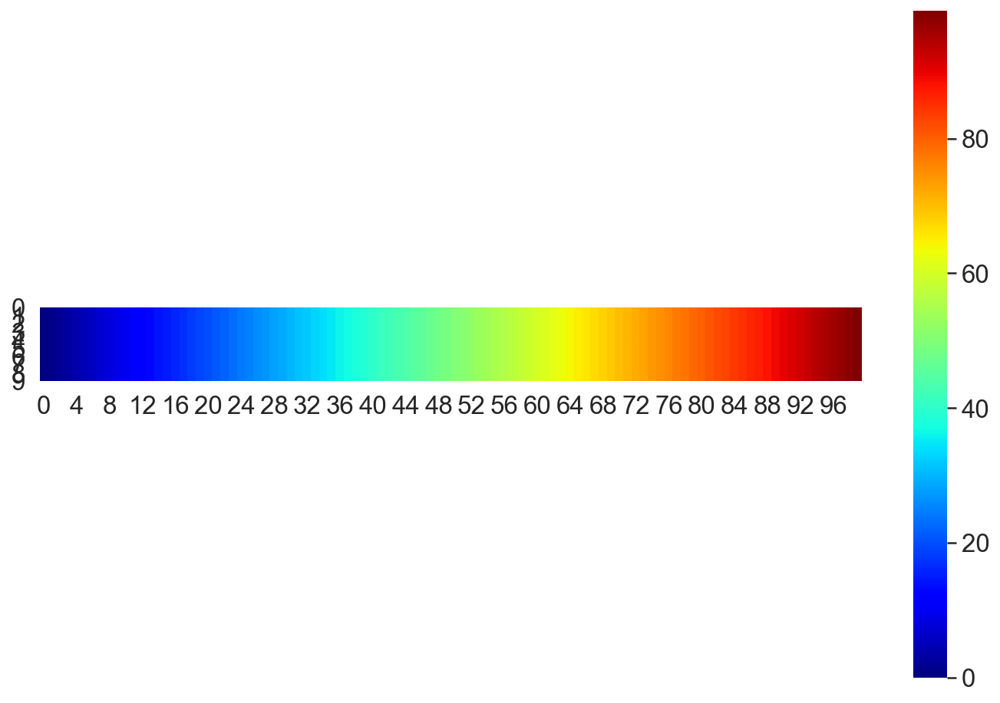

In [ ]:
image = [[i for i in range(100)]]*10
sns.heatmap(image, cmap='jet', square=True)

## Color

In [ ]:
# code snippet from Jake Vandeplas https://jakevdp.github.io/blog/2014/10/16/how-bad-is-your-colormap/
def grayify_cmap(cmap):
    """Return a grayscale version of the colormap"""
    cmap = plt.cm.get_cmap(cmap)
    colors = cmap(np.arange(cmap.N))
    
    # convert RGBA to perceived greyscale luminance
    # cf. http://alienryderflex.com/hsp.html
    RGB_weight = [0.299, 0.587, 0.114]
    luminance = np.sqrt(np.dot(colors[:, :3] ** 2, RGB_weight))
    colors[:, :3] = luminance[:, np.newaxis]
    
    return cmap.from_list(cmap.name + "_grayscale", colors, cmap.N)

In [ ]:
flights = sns.load_dataset("flights").pivot("month", "year", "passengers")


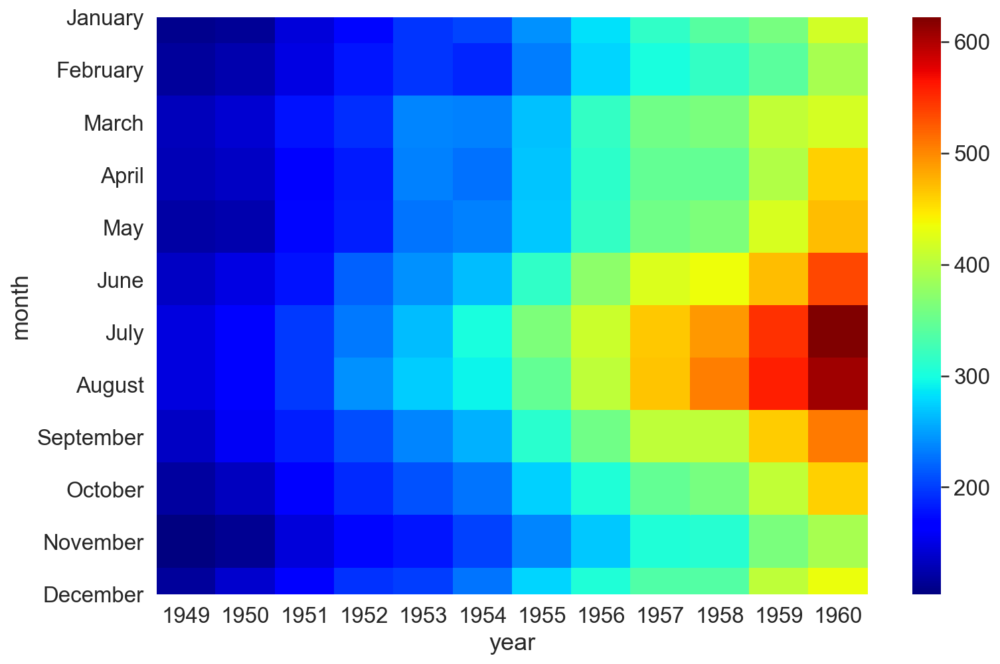

In [ ]:
sns.heatmap(flights, cmap='jet')

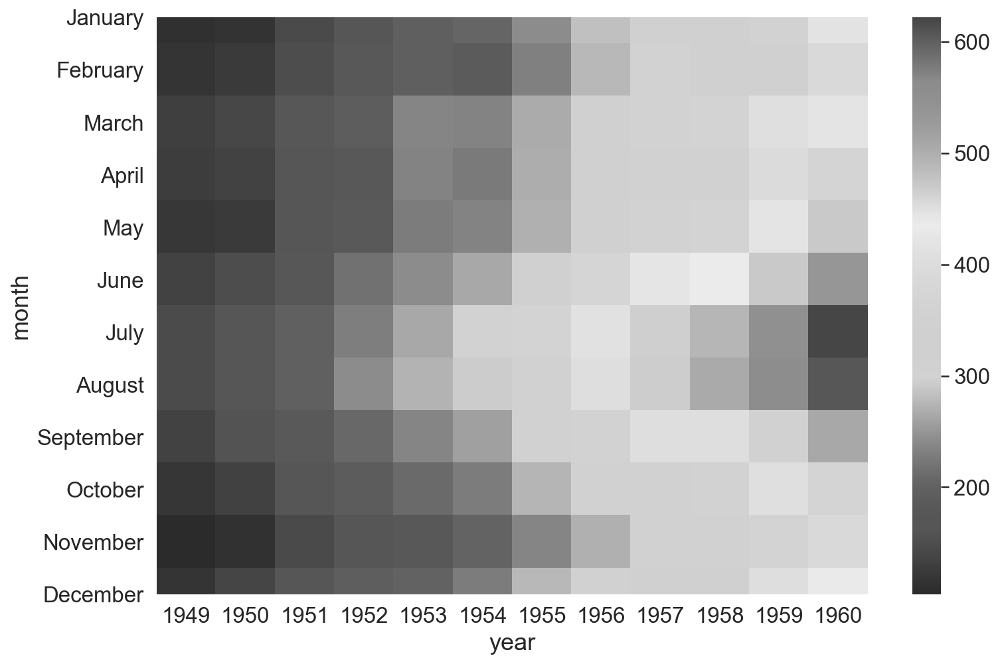

In [ ]:
sns.heatmap(flights, cmap=grayify_cmap('jet'))

## 3 Types of Viable Color palettes/colormaps:
### 1. Perceptually uniform sequential

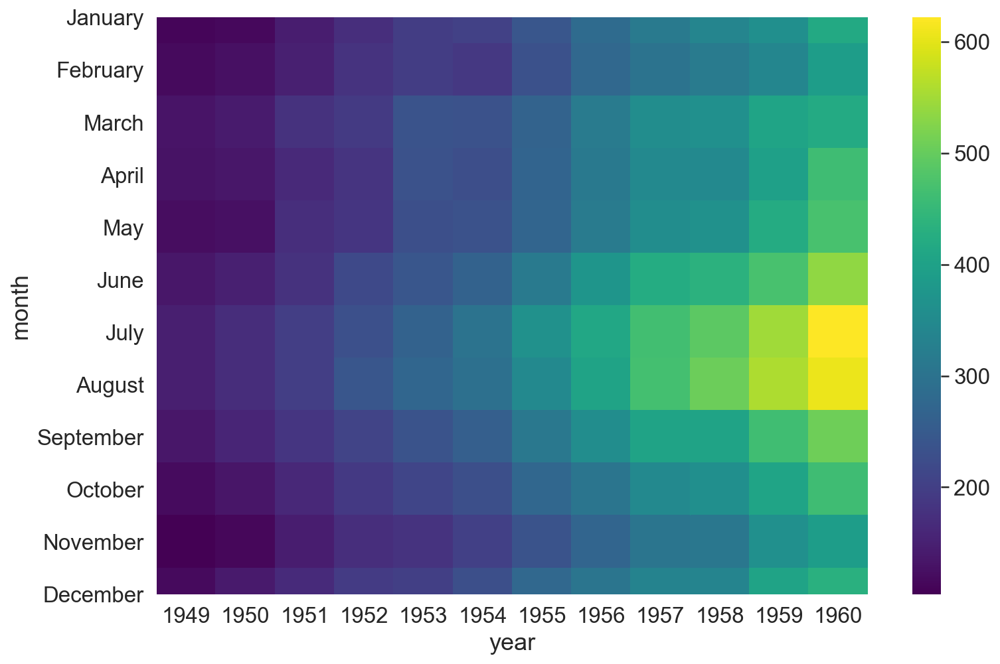

In [ ]:
sns.heatmap(flights, cmap='viridis')

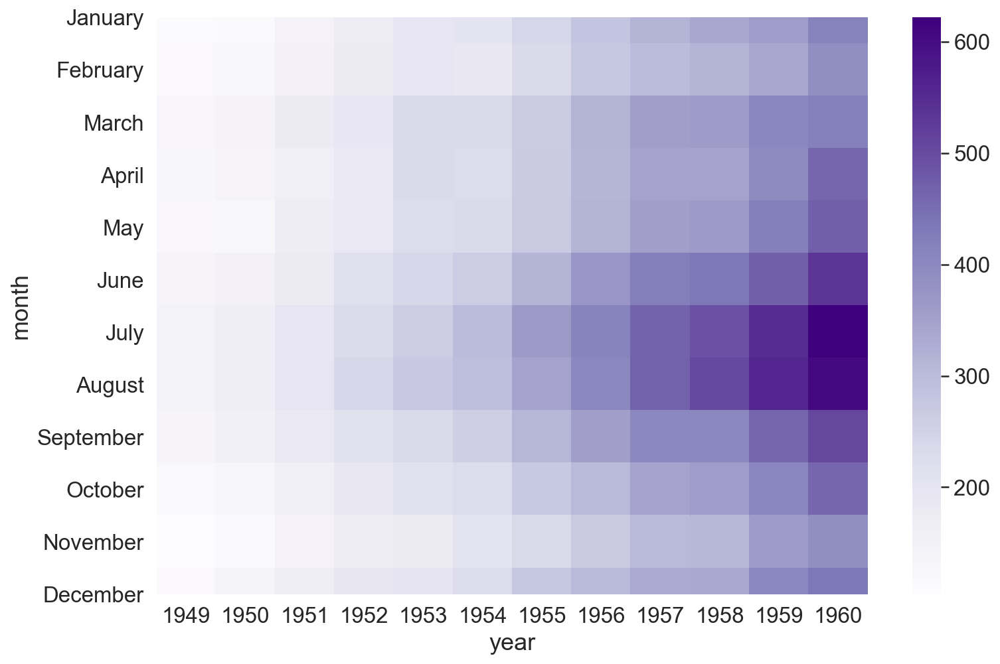

In [ ]:
sns.heatmap(flights, cmap='Purples')

## 2. Diverging 

In [ ]:
pit_climate_df = pd.DataFrame(
    dict(Month = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                  'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
         High = [2, 3, 10, 16, 22, 27, 28, 28, 24, 17, 10, 5],
         Low = [-7, -5, 0, 5, 11, 16, 18, 18, 14,7, 3, -2])
)

In [ ]:
pit_climate_df.head()

,Month,High,Low
0,Jan,2,-7
1,Feb,3,-5
2,Mar,10,0
3,Apr,16,5
4,May,22,11


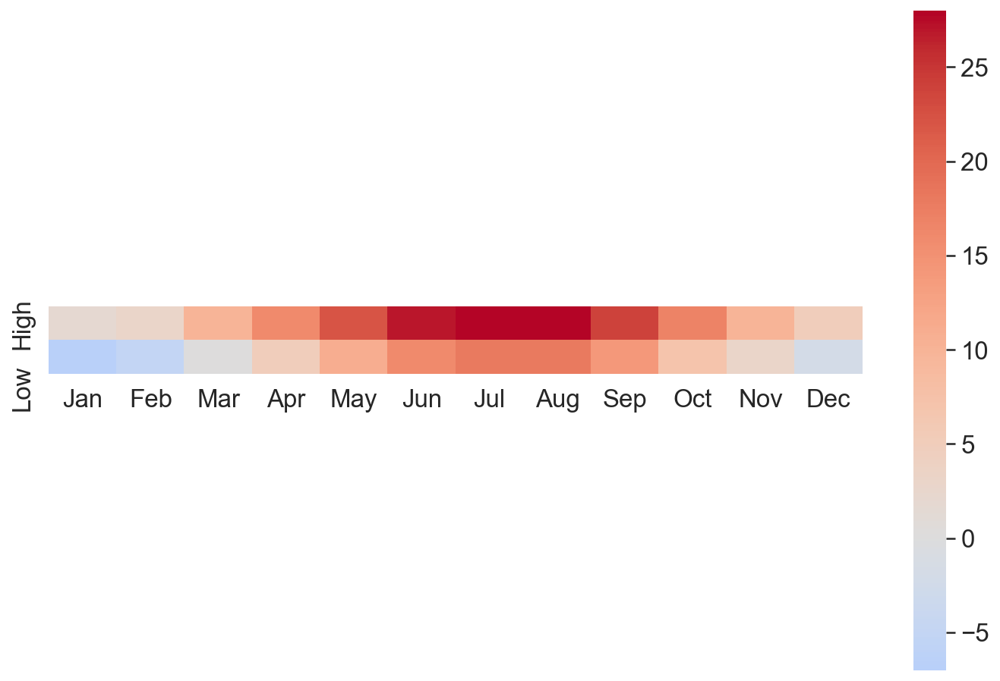

In [ ]:
sns.heatmap(pit_climate_df[['High', 'Low']].T,
            cmap='coolwarm', 
            center=0,#np.mean(pit_climate_df[['High', 'Low']].mean().mean()), 
            square=True,
            xticklabels=pit_climate_df['Month'])

## 3. Categorical

example from before:

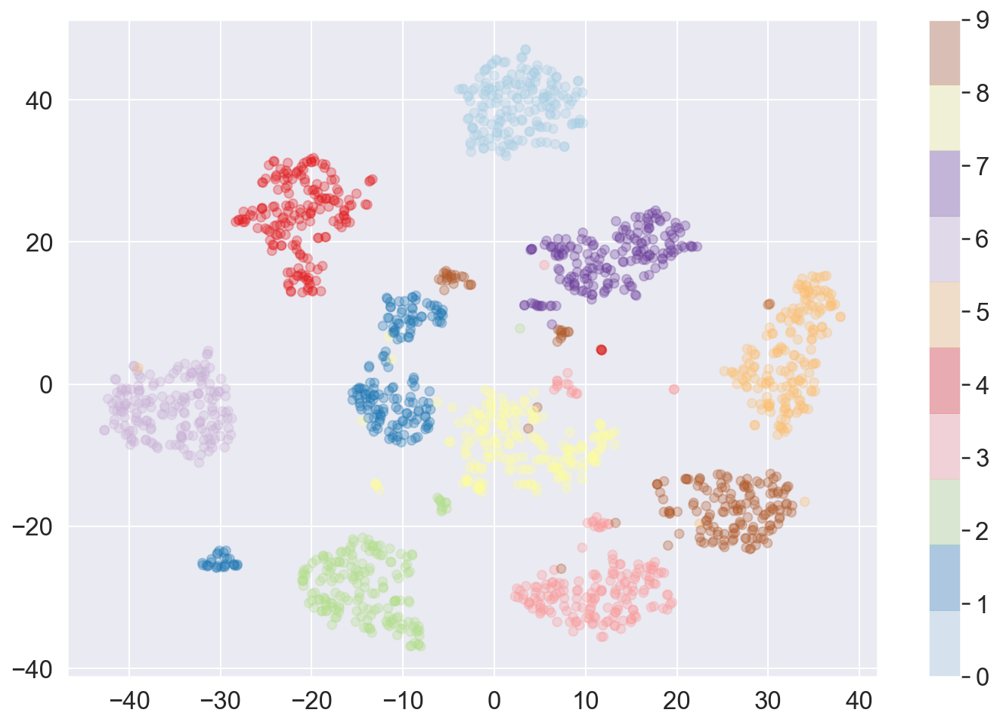

In [ ]:
plt.scatter(projected[:, 0], projected[:, 1],
            c=digits.target, alpha=0.3,
            cmap=plt.cm.get_cmap('Paired', 10))
plt.colorbar()

In [ ]:
from IPython.display import Image

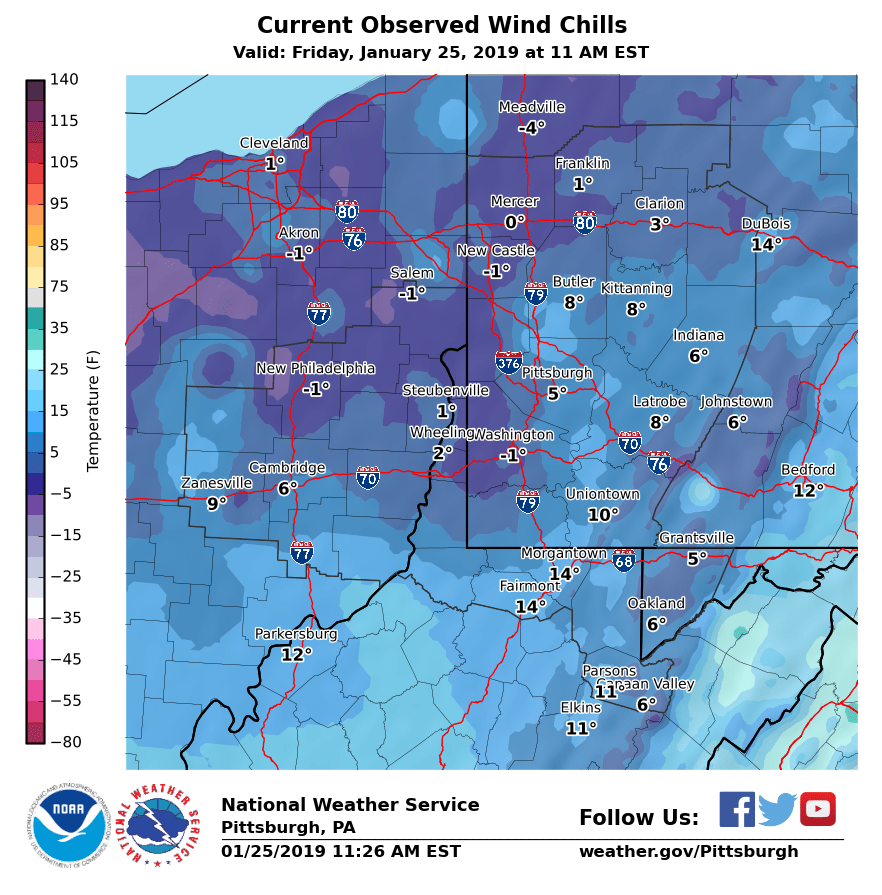

In [ ]:
Image('Resources/51417489_2006270206137719_6713863014199590912_n.png')

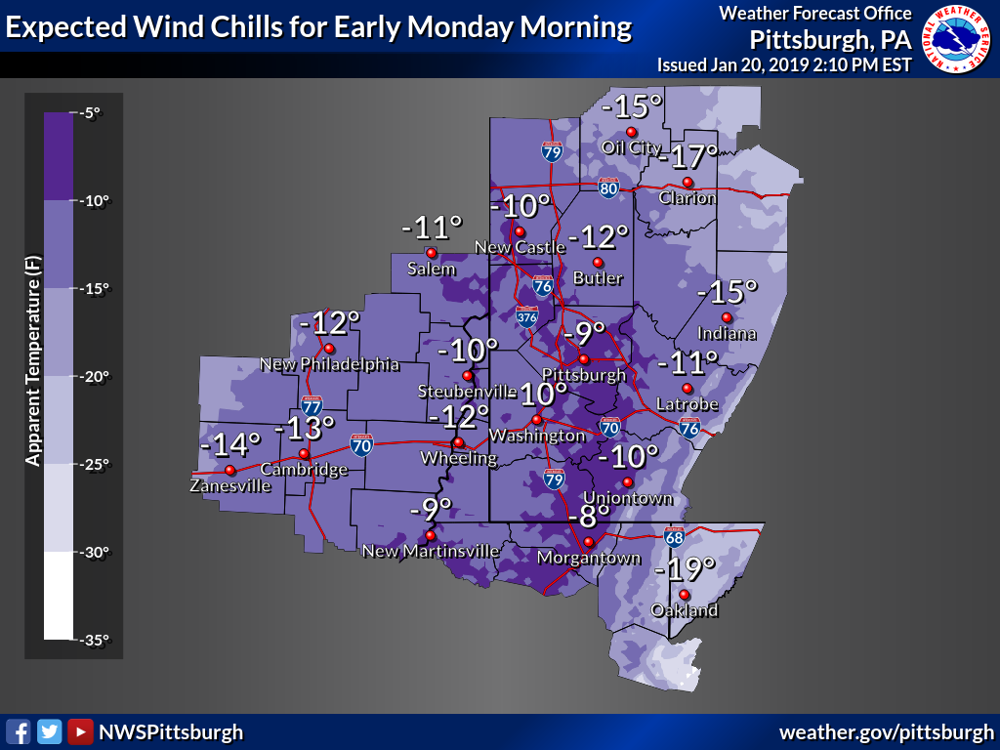

In [ ]:
Image('Resources/50283372_1999138550184218_5288878489854803968_o.png')

You can also specify a color palette to use for the rest of a notebook or script by running

Other things to consider: 
* Use salient marker types, full list at https://matplotlib.org/3.2.1/api/markers_api.html

In [ ]:
d1 = np.random.uniform(-2.5, 2.5, (100, 100))
d2 = np.random.randn(5,5)

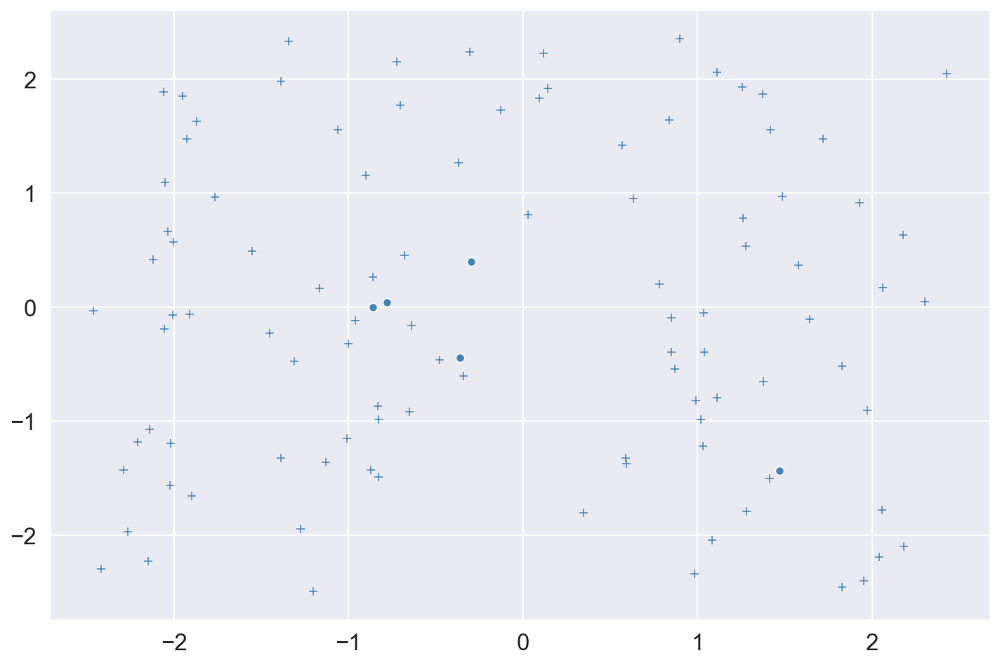

In [ ]:
sns.scatterplot(d1[:,0], d1[:,1], marker='+', color='steelblue')
sns.scatterplot(d2[:,0], d2[:,1], color='steelblue')

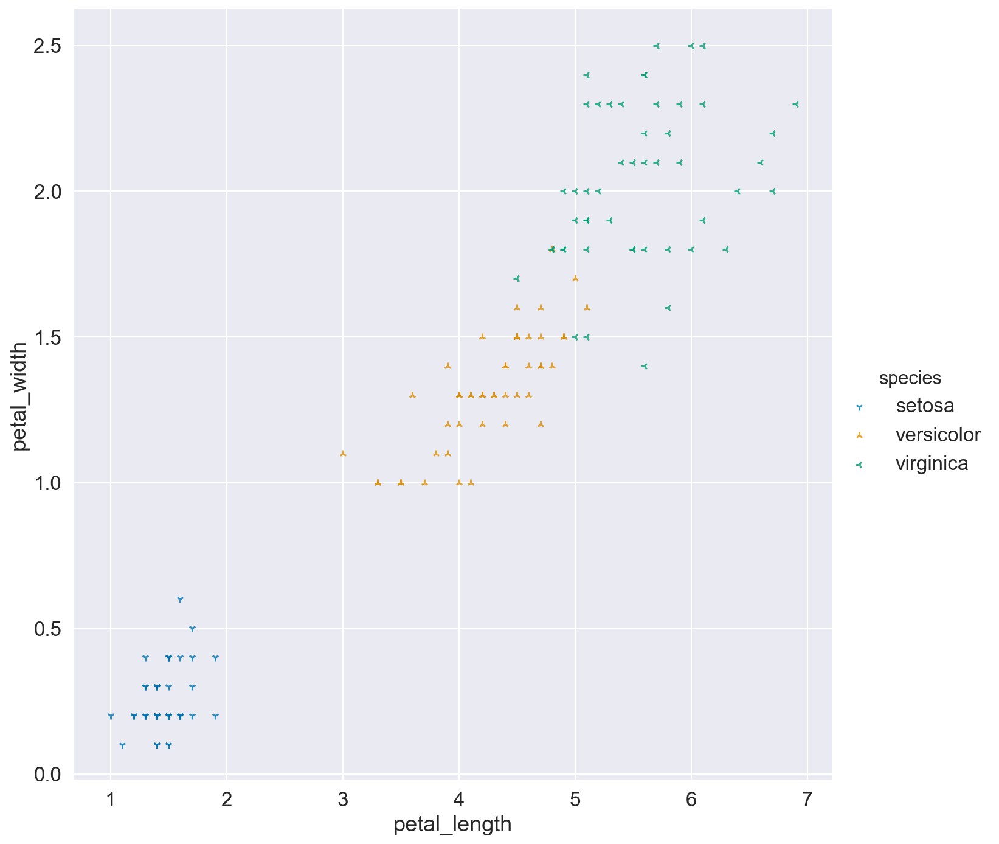

In [ ]:
sns.lmplot('petal_length', 'petal_width', iris, 
           height=10, 
           hue='species', 
           markers=['1','2','3'],
           fit_reg=False)

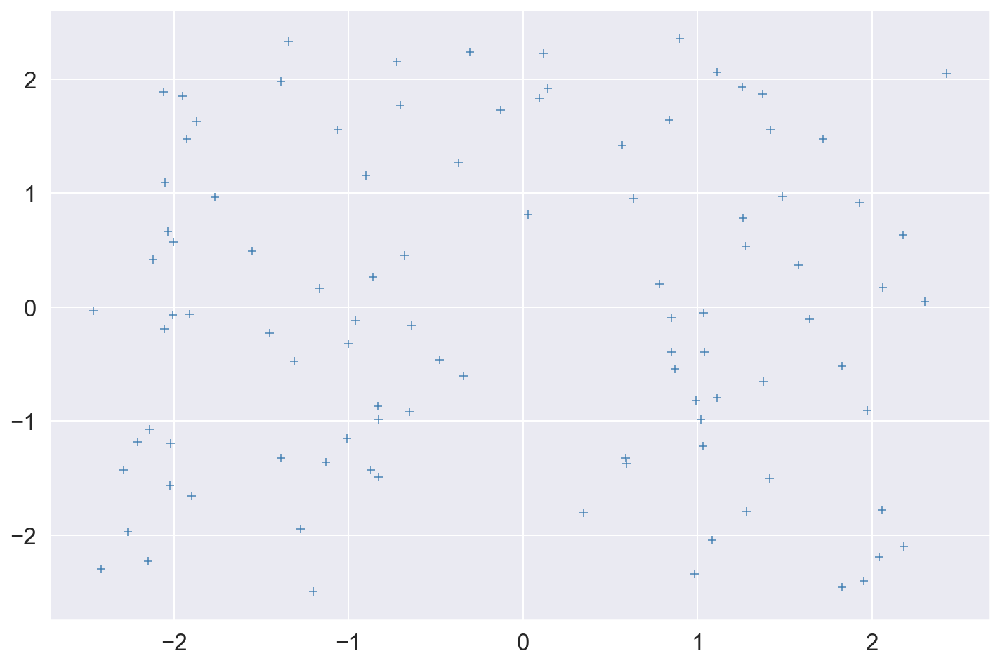

In [ ]:
sns.scatterplot(d1[:,0], d1[:,1], marker='+', color='steelblue')

There are more than 2 axes on a 2-dimensional screen. Can you think of ways to include more axes? 
We can use each of the following to map to an axis:
- color
- size (for numerical data)
- shape (for categorical data)
- literally making a 3D plot (as in the swiss roll, useful in the case of 3 spatial dimensions)

In [ ]:
sns.set_palette('colorblind')

Read more on choosing colors at:

* https://seaborn.pydata.org/tutorial/color_palettes.html
* https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

One of my favorite resources on clarity in plotting:

* http://blogs.nature.com/methagora/2013/07/data-visualization-points-of-view.html

New interesting package that we don't have time for today but is definitely worth mentioning. Makes visualization more intuitive by making it declarative is Altair https://altair-viz.github.io